# Part A: Loading the dataset

## 1) Import the necessary packages/libraries

In [1]:
from scipy.io import arff
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import csv
import plotly.express as px

from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.feature_selection import SelectKBest, chi2, mutual_info_classif, SelectFromModel, RFE
from mlxtend.feature_selection import SequentialFeatureSelector, ExhaustiveFeatureSelector
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.utils import resample

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier

from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,confusion_matrix,classification_report

## 2) Load the Full KDD train dataset

In [2]:
data = arff.loadarff(r'D:\\ASSIGNMENT\NSL-KDD\KDDTrain+.arff')
print(type(data))
data_train = pd.DataFrame(data[0])
data_train.head(10)

<class 'tuple'>


,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,class
0,0.0,b'tcp',b'ftp_data',b'SF',491.0,0.0,b'0',0.0,0.0,0.0,...,25.0,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,b'normal'
1,0.0,b'udp',b'other',b'SF',146.0,0.0,b'0',0.0,0.0,0.0,...,1.0,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,b'normal'
2,0.0,b'tcp',b'private',b'S0',0.0,0.0,b'0',0.0,0.0,0.0,...,26.0,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,b'anomaly'
3,0.0,b'tcp',b'http',b'SF',232.0,8153.0,b'0',0.0,0.0,0.0,...,255.0,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,b'normal'
4,0.0,b'tcp',b'http',b'SF',199.0,420.0,b'0',0.0,0.0,0.0,...,255.0,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,b'normal'
5,0.0,b'tcp',b'private',b'REJ',0.0,0.0,b'0',0.0,0.0,0.0,...,19.0,0.07,0.07,0.00,0.00,0.00,0.00,1.00,1.00,b'anomaly'
6,0.0,b'tcp',b'private',b'S0',0.0,0.0,b'0',0.0,0.0,0.0,...,9.0,0.04,0.05,0.00,0.00,1.00,1.00,0.00,0.00,b'anomaly'
7,0.0,b'tcp',b'private',b'S0',0.0,0.0,b'0',0.0,0.0,0.0,...,15.0,0.06,0.07,0.00,0.00,1.00,1.00,0.00,0.00,b'anomaly'
8,0.0,b'tcp',b'remote_job',b'S0',0.0,0.0,b'0',0.0,0.0,0.0,...,23.0,0.09,0.05,0.00,0.00,1.00,1.00,0.00,0.00,b'anomaly'
9,0.0,b'tcp',b'private',b'S0',0.0,0.0,b'0',0.0,0.0,0.0,...,13.0,0.05,0.06,0.00,0.00,1.00,1.00,0.00,0.00,b'anomaly'


In [3]:
data_train.head(10)

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,class
0,0.0,b'tcp',b'ftp_data',b'SF',491.0,0.0,b'0',0.0,0.0,0.0,...,25.0,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,b'normal'
1,0.0,b'udp',b'other',b'SF',146.0,0.0,b'0',0.0,0.0,0.0,...,1.0,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,b'normal'
2,0.0,b'tcp',b'private',b'S0',0.0,0.0,b'0',0.0,0.0,0.0,...,26.0,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,b'anomaly'
3,0.0,b'tcp',b'http',b'SF',232.0,8153.0,b'0',0.0,0.0,0.0,...,255.0,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,b'normal'
4,0.0,b'tcp',b'http',b'SF',199.0,420.0,b'0',0.0,0.0,0.0,...,255.0,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,b'normal'
5,0.0,b'tcp',b'private',b'REJ',0.0,0.0,b'0',0.0,0.0,0.0,...,19.0,0.07,0.07,0.00,0.00,0.00,0.00,1.00,1.00,b'anomaly'
6,0.0,b'tcp',b'private',b'S0',0.0,0.0,b'0',0.0,0.0,0.0,...,9.0,0.04,0.05,0.00,0.00,1.00,1.00,0.00,0.00,b'anomaly'
7,0.0,b'tcp',b'private',b'S0',0.0,0.0,b'0',0.0,0.0,0.0,...,15.0,0.06,0.07,0.00,0.00,1.00,1.00,0.00,0.00,b'anomaly'
8,0.0,b'tcp',b'remote_job',b'S0',0.0,0.0,b'0',0.0,0.0,0.0,...,23.0,0.09,0.05,0.00,0.00,1.00,1.00,0.00,0.00,b'anomaly'
9,0.0,b'tcp',b'private',b'S0',0.0,0.0,b'0',0.0,0.0,0.0,...,13.0,0.05,0.06,0.00,0.00,1.00,1.00,0.00,0.00,b'anomaly'


In [4]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125973 entries, 0 to 125972
Data columns (total 42 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   duration                     125973 non-null  float64
 1   protocol_type                125973 non-null  object 
 2   service                      125973 non-null  object 
 3   flag                         125973 non-null  object 
 4   src_bytes                    125973 non-null  float64
 5   dst_bytes                    125973 non-null  float64
 6   land                         125973 non-null  object 
 7   wrong_fragment               125973 non-null  float64
 8   urgent                       125973 non-null  float64
 9   hot                          125973 non-null  float64
 10  num_failed_logins            125973 non-null  float64
 11  logged_in                    125973 non-null  object 
 12  num_compromised              125973 non-null  float64
 13 

In [5]:
data_train.dtypes

duration                       float64
protocol_type                   object
service                         object
flag                            object
src_bytes                      float64
dst_bytes                      float64
land                            object
wrong_fragment                 float64
urgent                         float64
hot                            float64
num_failed_logins              float64
logged_in                       object
num_compromised                float64
root_shell                     float64
su_attempted                   float64
num_root                       float64
num_file_creations             float64
num_shells                     float64
num_access_files               float64
num_outbound_cmds              float64
is_host_login                   object
is_guest_login                  object
count                          float64
srv_count                      float64
serror_rate                    float64
srv_serror_rate          

## 3) Load the Full KDD Test Dataset

In [6]:
data2 = arff.loadarff(r'D:\\ASSIGNMENT\NSL-KDD\KDDTest+.arff')
print(type(data2))
# print(data2[0])
data_test= pd.DataFrame(data2[0])
data_test.head(10)

<class 'tuple'>


,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,class
0,0.0,b'tcp',b'private',b'REJ',0.0,0.0,b'0',0.0,0.0,0.0,...,10.0,0.04,0.06,0.00,0.00,0.00,0.00,1.00,1.00,b'anomaly'
1,0.0,b'tcp',b'private',b'REJ',0.0,0.0,b'0',0.0,0.0,0.0,...,1.0,0.00,0.06,0.00,0.00,0.00,0.00,1.00,1.00,b'anomaly'
2,2.0,b'tcp',b'ftp_data',b'SF',12983.0,0.0,b'0',0.0,0.0,0.0,...,86.0,0.61,0.04,0.61,0.02,0.00,0.00,0.00,0.00,b'normal'
3,0.0,b'icmp',b'eco_i',b'SF',20.0,0.0,b'0',0.0,0.0,0.0,...,57.0,1.00,0.00,1.00,0.28,0.00,0.00,0.00,0.00,b'anomaly'
4,1.0,b'tcp',b'telnet',b'RSTO',0.0,15.0,b'0',0.0,0.0,0.0,...,86.0,0.31,0.17,0.03,0.02,0.00,0.00,0.83,0.71,b'anomaly'
5,0.0,b'tcp',b'http',b'SF',267.0,14515.0,b'0',0.0,0.0,0.0,...,255.0,1.00,0.00,0.01,0.03,0.01,0.00,0.00,0.00,b'normal'
6,0.0,b'tcp',b'smtp',b'SF',1022.0,387.0,b'0',0.0,0.0,0.0,...,28.0,0.11,0.72,0.00,0.00,0.00,0.00,0.72,0.04,b'normal'
7,0.0,b'tcp',b'telnet',b'SF',129.0,174.0,b'0',0.0,0.0,0.0,...,255.0,1.00,0.00,0.00,0.00,0.01,0.01,0.02,0.02,b'anomaly'
8,0.0,b'tcp',b'http',b'SF',327.0,467.0,b'0',0.0,0.0,0.0,...,255.0,1.00,0.00,0.01,0.03,0.00,0.00,0.00,0.00,b'normal'
9,0.0,b'tcp',b'ftp',b'SF',26.0,157.0,b'0',0.0,0.0,0.0,...,26.0,0.50,0.08,0.02,0.00,0.00,0.00,0.00,0.00,b'anomaly'


In [7]:
data_test.head(10)

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,class
0,0.0,b'tcp',b'private',b'REJ',0.0,0.0,b'0',0.0,0.0,0.0,...,10.0,0.04,0.06,0.00,0.00,0.00,0.00,1.00,1.00,b'anomaly'
1,0.0,b'tcp',b'private',b'REJ',0.0,0.0,b'0',0.0,0.0,0.0,...,1.0,0.00,0.06,0.00,0.00,0.00,0.00,1.00,1.00,b'anomaly'
2,2.0,b'tcp',b'ftp_data',b'SF',12983.0,0.0,b'0',0.0,0.0,0.0,...,86.0,0.61,0.04,0.61,0.02,0.00,0.00,0.00,0.00,b'normal'
3,0.0,b'icmp',b'eco_i',b'SF',20.0,0.0,b'0',0.0,0.0,0.0,...,57.0,1.00,0.00,1.00,0.28,0.00,0.00,0.00,0.00,b'anomaly'
4,1.0,b'tcp',b'telnet',b'RSTO',0.0,15.0,b'0',0.0,0.0,0.0,...,86.0,0.31,0.17,0.03,0.02,0.00,0.00,0.83,0.71,b'anomaly'
5,0.0,b'tcp',b'http',b'SF',267.0,14515.0,b'0',0.0,0.0,0.0,...,255.0,1.00,0.00,0.01,0.03,0.01,0.00,0.00,0.00,b'normal'
6,0.0,b'tcp',b'smtp',b'SF',1022.0,387.0,b'0',0.0,0.0,0.0,...,28.0,0.11,0.72,0.00,0.00,0.00,0.00,0.72,0.04,b'normal'
7,0.0,b'tcp',b'telnet',b'SF',129.0,174.0,b'0',0.0,0.0,0.0,...,255.0,1.00,0.00,0.00,0.00,0.01,0.01,0.02,0.02,b'anomaly'
8,0.0,b'tcp',b'http',b'SF',327.0,467.0,b'0',0.0,0.0,0.0,...,255.0,1.00,0.00,0.01,0.03,0.00,0.00,0.00,0.00,b'normal'
9,0.0,b'tcp',b'ftp',b'SF',26.0,157.0,b'0',0.0,0.0,0.0,...,26.0,0.50,0.08,0.02,0.00,0.00,0.00,0.00,0.00,b'anomaly'


In [8]:
data_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22544 entries, 0 to 22543
Data columns (total 42 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   duration                     22544 non-null  float64
 1   protocol_type                22544 non-null  object 
 2   service                      22544 non-null  object 
 3   flag                         22544 non-null  object 
 4   src_bytes                    22544 non-null  float64
 5   dst_bytes                    22544 non-null  float64
 6   land                         22544 non-null  object 
 7   wrong_fragment               22544 non-null  float64
 8   urgent                       22544 non-null  float64
 9   hot                          22544 non-null  float64
 10  num_failed_logins            22544 non-null  float64
 11  logged_in                    22544 non-null  object 
 12  num_compromised              22544 non-null  float64
 13  root_shell      

In [9]:
data_test.dtypes

duration                       float64
protocol_type                   object
service                         object
flag                            object
src_bytes                      float64
dst_bytes                      float64
land                            object
wrong_fragment                 float64
urgent                         float64
hot                            float64
num_failed_logins              float64
logged_in                       object
num_compromised                float64
root_shell                     float64
su_attempted                   float64
num_root                       float64
num_file_creations             float64
num_shells                     float64
num_access_files               float64
num_outbound_cmds              float64
is_host_login                   object
is_guest_login                  object
count                          float64
srv_count                      float64
serror_rate                    float64
srv_serror_rate          

# Part B: Data Pre-Processing

## 4) Check for the correlation using visualization for Train and Test Dataset

In [10]:
corr_data_train=data_train.corr()

In [11]:
corr_data_test=data_test.corr()

<Axes: >

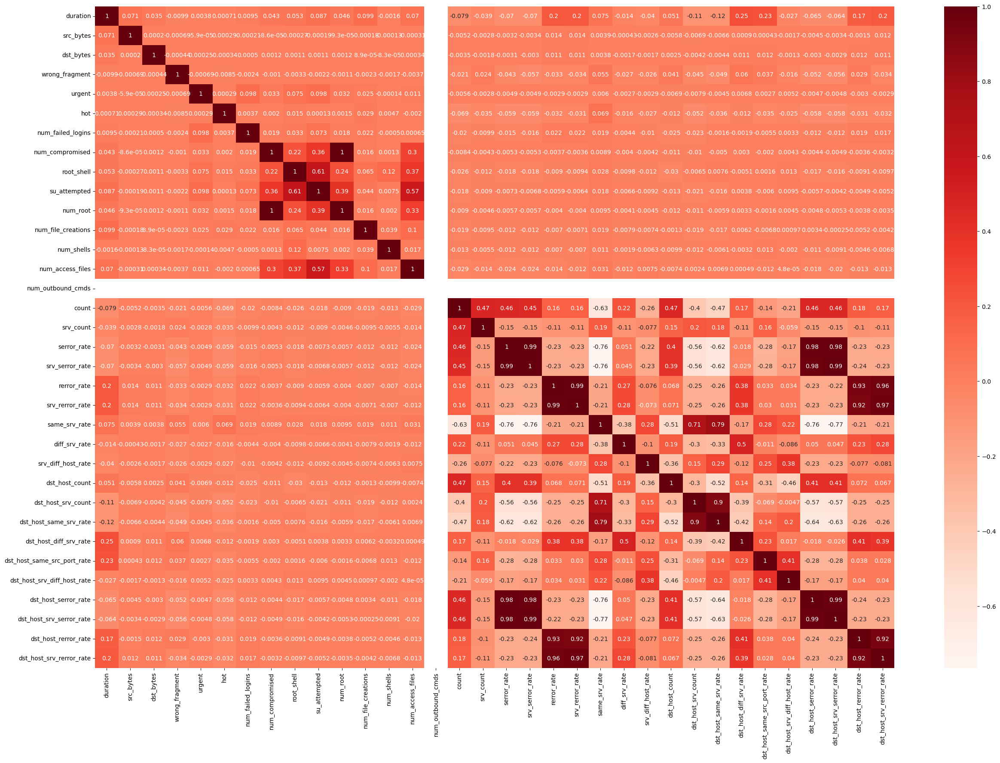

In [12]:
## Train Dataset
plt.figure(figsize=(30,20))
sns.heatmap(data_train.corr(),cbar=True,annot=True,cmap='Reds')

<Axes: >

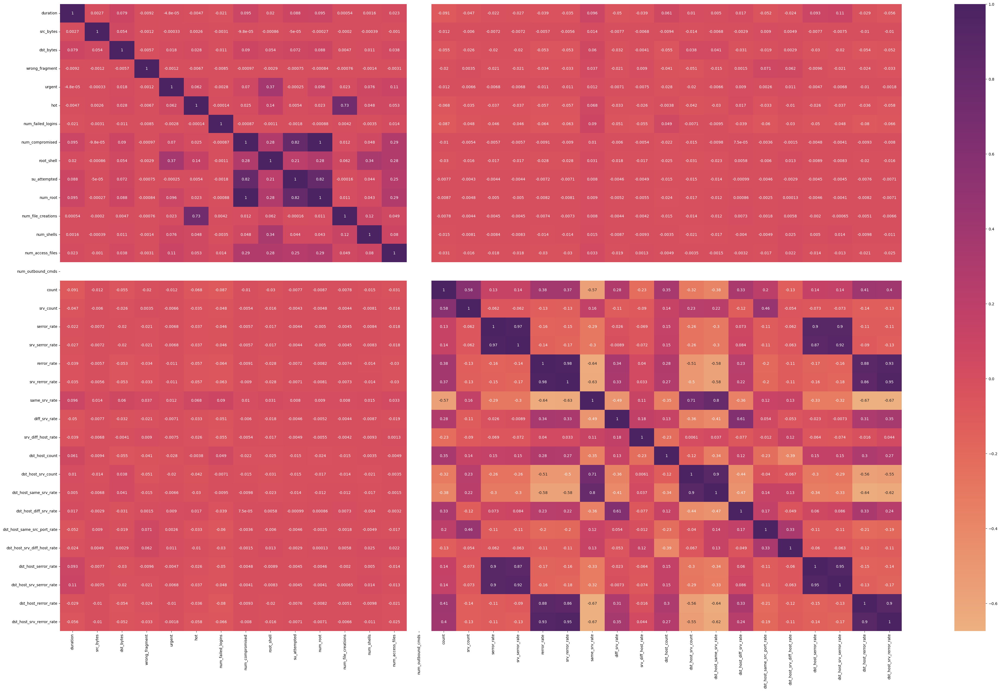

In [13]:
## Test Dataset
plt.figure(figsize=(50,30))
sns.heatmap(data_test.corr(),cbar=True,annot=True,cmap='flare')

### 4.1) Removing the highly positive correlations

['num_root', 'srv_serror_rate', 'srv_rerror_rate', 'dst_host_serror_rate', 'dst_host_srv_serror_rate', 'dst_host_srv_rerror_rate']


<Axes: >

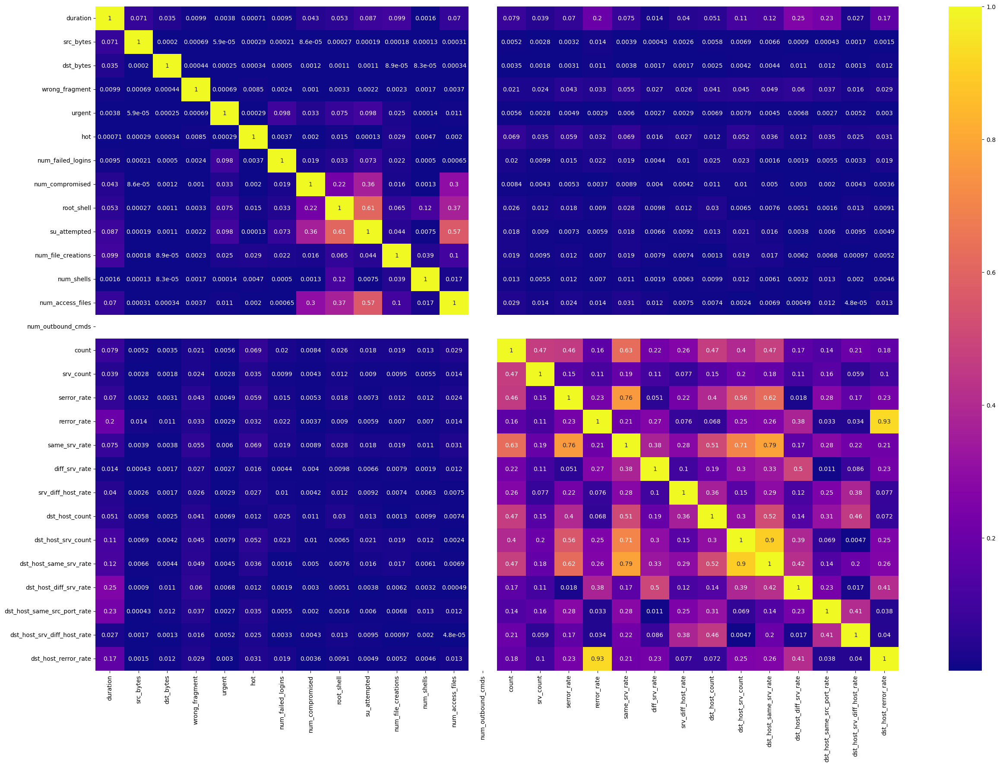

In [14]:
# Select upper triangle of correlation matrix
upper = corr_data_train.where(np.triu(np.ones(corr_data_train.shape), k=1).astype(bool))
# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
print(to_drop)
# Drop features 
data_train.drop(to_drop, axis=1, inplace=True)

# Plotting new correlation matrix for train dataset
plt.figure(figsize=(30,20))
sns.heatmap(data_train.corr().abs(),cbar=True,annot=True,cmap='plasma')

['num_root', 'srv_serror_rate', 'srv_rerror_rate']


<Axes: >

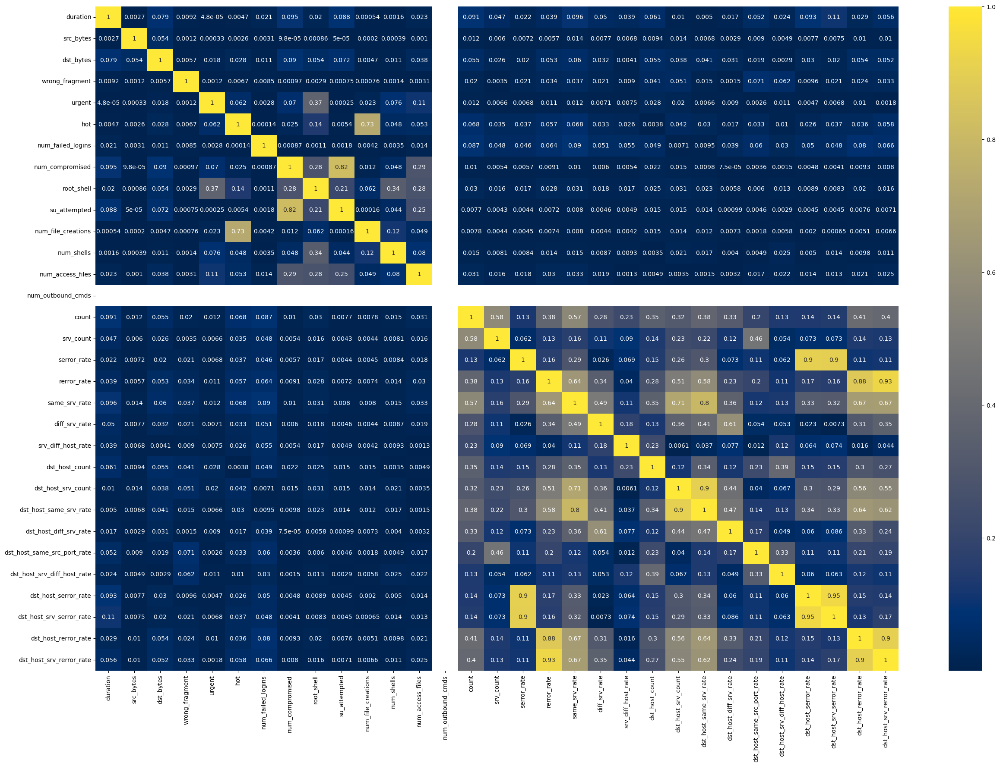

In [15]:
# Select upper triangle of correlation matrix
upper1 = corr_data_test.where(np.triu(np.ones(corr_data_test.shape), k=1).astype(bool))
# Find features with correlation greater than 0.95
to_drop = [column for column in upper1.columns if any(upper1[column] > 0.95)]
print(to_drop)
# Drop features 
data_test.drop(to_drop, axis=1, inplace=True)

# Plotting new correlation matrix for train dataset
plt.figure(figsize=(30,20))
sns.heatmap(data_test.corr().abs(),cbar=True,annot=True,cmap='cividis')

In [16]:
data_train.columns

Index(['duration', 'protocol_type', 'service', 'flag', 'src_bytes',
       'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot',
       'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell',
       'su_attempted', 'num_file_creations', 'num_shells', 'num_access_files',
       'num_outbound_cmds', 'is_host_login', 'is_guest_login', 'count',
       'srv_count', 'serror_rate', 'rerror_rate', 'same_srv_rate',
       'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count',
       'dst_host_srv_count', 'dst_host_same_srv_rate',
       'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate',
       'dst_host_srv_diff_host_rate', 'dst_host_rerror_rate', 'class'],
      dtype='object')

In [17]:
data_test.columns

Index(['duration', 'protocol_type', 'service', 'flag', 'src_bytes',
       'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot',
       'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell',
       'su_attempted', 'num_file_creations', 'num_shells', 'num_access_files',
       'num_outbound_cmds', 'is_host_login', 'is_guest_login', 'count',
       'srv_count', 'serror_rate', 'rerror_rate', 'same_srv_rate',
       'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count',
       'dst_host_srv_count', 'dst_host_same_srv_rate',
       'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate',
       'dst_host_srv_diff_host_rate', 'dst_host_serror_rate',
       'dst_host_srv_serror_rate', 'dst_host_rerror_rate',
       'dst_host_srv_rerror_rate', 'class'],
      dtype='object')

In [18]:
data_test=data_test.drop(['dst_host_srv_rerror_rate','dst_host_srv_serror_rate','dst_host_serror_rate'],axis=1)
data_test.columns

Index(['duration', 'protocol_type', 'service', 'flag', 'src_bytes',
       'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot',
       'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell',
       'su_attempted', 'num_file_creations', 'num_shells', 'num_access_files',
       'num_outbound_cmds', 'is_host_login', 'is_guest_login', 'count',
       'srv_count', 'serror_rate', 'rerror_rate', 'same_srv_rate',
       'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count',
       'dst_host_srv_count', 'dst_host_same_srv_rate',
       'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate',
       'dst_host_srv_diff_host_rate', 'dst_host_rerror_rate', 'class'],
      dtype='object')

# Part C: Feature Engineering

### 1) Data Transformation: Since it is binary classification problem, perform transformation on class label and encode 'normal' as 0 and 'anomaly' as 1. This step will help us to identify intrusion detection

In [19]:
data_train['class_transform'] = data_train['class'].map(lambda i:0 if i==b'normal' else 1)
data_test['class_transform'] = data_test['class'].map(lambda i:0 if i==b'normal' else 1)

### 2) Converting the categorical variables into numericals using intergers

In [20]:
# Convert the categorical variables into numericals
categorical_variables = ['flag','service','protocol_type','land','logged_in',\
                         'is_host_login','is_guest_login','class']
enc = LabelEncoder()
for i in categorical_variables:
    data_train[i] = enc.fit_transform(data_train[i]) 
    data_test[i] = enc.fit_transform(data_test[i]) 

In [21]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125973 entries, 0 to 125972
Data columns (total 37 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   duration                     125973 non-null  float64
 1   protocol_type                125973 non-null  int32  
 2   service                      125973 non-null  int32  
 3   flag                         125973 non-null  int32  
 4   src_bytes                    125973 non-null  float64
 5   dst_bytes                    125973 non-null  float64
 6   land                         125973 non-null  int32  
 7   wrong_fragment               125973 non-null  float64
 8   urgent                       125973 non-null  float64
 9   hot                          125973 non-null  float64
 10  num_failed_logins            125973 non-null  float64
 11  logged_in                    125973 non-null  int32  
 12  num_compromised              125973 non-null  float64
 13 

In [22]:
data_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22544 entries, 0 to 22543
Data columns (total 37 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   duration                     22544 non-null  float64
 1   protocol_type                22544 non-null  int32  
 2   service                      22544 non-null  int32  
 3   flag                         22544 non-null  int32  
 4   src_bytes                    22544 non-null  float64
 5   dst_bytes                    22544 non-null  float64
 6   land                         22544 non-null  int32  
 7   wrong_fragment               22544 non-null  float64
 8   urgent                       22544 non-null  float64
 9   hot                          22544 non-null  float64
 10  num_failed_logins            22544 non-null  float64
 11  logged_in                    22544 non-null  int32  
 12  num_compromised              22544 non-null  float64
 13  root_shell      

In [23]:
data_train=data_train.drop(['class'],axis=1)
data_train.columns

Index(['duration', 'protocol_type', 'service', 'flag', 'src_bytes',
       'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot',
       'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell',
       'su_attempted', 'num_file_creations', 'num_shells', 'num_access_files',
       'num_outbound_cmds', 'is_host_login', 'is_guest_login', 'count',
       'srv_count', 'serror_rate', 'rerror_rate', 'same_srv_rate',
       'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count',
       'dst_host_srv_count', 'dst_host_same_srv_rate',
       'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate',
       'dst_host_srv_diff_host_rate', 'dst_host_rerror_rate',
       'class_transform'],
      dtype='object')

In [24]:
data_test=data_test.drop(['class'],axis=1)
data_test.columns

Index(['duration', 'protocol_type', 'service', 'flag', 'src_bytes',
       'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot',
       'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell',
       'su_attempted', 'num_file_creations', 'num_shells', 'num_access_files',
       'num_outbound_cmds', 'is_host_login', 'is_guest_login', 'count',
       'srv_count', 'serror_rate', 'rerror_rate', 'same_srv_rate',
       'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count',
       'dst_host_srv_count', 'dst_host_same_srv_rate',
       'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate',
       'dst_host_srv_diff_host_rate', 'dst_host_rerror_rate',
       'class_transform'],
      dtype='object')

# Part D: Model Selection

## 1) Train-Validation-Test split

In [25]:
# Select the input and target variables
X_train = data_train.iloc[:,data_train.columns!='class_transform']
y_train = data_train["class_transform"] 

X_test = data_test.iloc[:,data_train.columns!='class_transform']
y_test = data_test["class_transform"]  

In [26]:
# Split the train dataset into train and validation
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.16, random_state= 10)

print("X_train shape = {}".format(X_train.shape))
print("y_train shape = {}".format(y_train.shape))
print("X_test shape = {}".format(X_test.shape))
print("y_test shape = {}".format(y_test.shape))
print("X_validation shape = {}".format(X_valid.shape))
print("y_validation shape = {}".format(y_valid.shape))

X_train shape = (105817, 35)
y_train shape = (105817,)
X_test shape = (22544, 35)
y_test shape = (22544,)
X_validation shape = (20156, 35)
y_validation shape = (20156,)


# Part E: Model Training

## 1) Choosing the model for training
### 1.1) Decision Tree Classifier

In [27]:
model_dt = DecisionTreeClassifier(criterion='gini',splitter='best',max_depth=None,random_state=10,
                                 class_weight="balanced")
model_dt.fit(X_train,y_train)
print("Model Feature Importances (Decision Tree Classifier) = " ,model_dt.feature_importances_)

Model Feature Importances (Decision Tree Classifier) =  [4.62556722e-03 7.23049824e-02 1.30859761e-02 2.37222047e-02
 7.51492451e-01 2.12187566e-02 0.00000000e+00 0.00000000e+00
 4.06375148e-05 2.47347298e-02 4.00506011e-05 9.15767297e-03
 8.38245222e-05 5.56909320e-05 0.00000000e+00 1.67752819e-04
 2.29221517e-04 1.20200281e-04 0.00000000e+00 0.00000000e+00
 0.00000000e+00 5.89886756e-04 7.89049235e-04 1.44081939e-03
 3.57969891e-06 1.21006420e-04 8.83123153e-04 1.78069100e-04
 1.98608513e-03 4.81870396e-02 6.02771338e-03 1.92640966e-03
 7.88124368e-03 5.56661468e-03 3.33964112e-03]


In [28]:
## Predict the model
y_train_predict_dt=model_dt.predict(X_train)
y_predict_dt=model_dt.predict(X_test)

- The predict_proba() function is used to predict the probability of a sample belonging to a particular class in a classification problem. 
- The function returns an array of shape (n_samples, n_classes), where n_samples is the number of samples and n_classes is the number of classes in the problem.

In [29]:
df_probs_dt = model_dt.predict_proba(X_test)
print(df_probs_dt)

[[0. 1.]
 [0. 1.]
 [1. 0.]
 ...
 [0. 1.]
 [1. 0.]
 [0. 1.]]


In [30]:
# Show the probabilities for the positive outcome only
df_probs_positive_dt = df_probs_dt[:, 1]
print("Positive Outcome Probabilities: ",df_probs_positive_dt)

Positive Outcome Probabilities:  [1. 1. 0. ... 1. 0. 1.]


In [31]:
# Show the probabilities for the negative outcome only
df_probs_negative_dt = df_probs_dt[:, 0]
print("Negative Outcome Probabilities: ",df_probs_negative_dt)

Negative Outcome Probabilities:  [0. 0. 1. ... 0. 1. 0.]


In [32]:
X_features_dt = model_dt.feature_names_in_
print(X_features_dt)

['duration' 'protocol_type' 'service' 'flag' 'src_bytes' 'dst_bytes'
 'land' 'wrong_fragment' 'urgent' 'hot' 'num_failed_logins' 'logged_in'
 'num_compromised' 'root_shell' 'su_attempted' 'num_file_creations'
 'num_shells' 'num_access_files' 'num_outbound_cmds' 'is_host_login'
 'is_guest_login' 'count' 'srv_count' 'serror_rate' 'rerror_rate'
 'same_srv_rate' 'diff_srv_rate' 'srv_diff_host_rate' 'dst_host_count'
 'dst_host_srv_count' 'dst_host_same_srv_rate' 'dst_host_diff_srv_rate'
 'dst_host_same_src_port_rate' 'dst_host_srv_diff_host_rate'
 'dst_host_rerror_rate']


In [33]:
print(classification_report(y_test,y_predict_dt))

              precision    recall  f1-score   support

           0       0.67      0.97      0.79      9711
           1       0.96      0.64      0.77     12833

    accuracy                           0.78     22544
   macro avg       0.82      0.80      0.78     22544
weighted avg       0.84      0.78      0.78     22544



### 1.2) Random Forest Classifier

In [34]:
model_rf = RandomForestClassifier(n_estimators=10,criterion='gini',max_depth=5,random_state=10,
                                 class_weight="balanced")
model_rf.fit(X_train,y_train)
print("Model Feature Importances (Random Forest Classifier) = " ,model_rf.feature_importances_)

Model Feature Importances (Random Forest Classifier) =  [1.27021234e-03 1.99187100e-02 2.96197562e-02 2.85555885e-01
 1.59512809e-01 1.19669753e-01 4.53093549e-05 3.00905042e-03
 0.00000000e+00 4.67429622e-03 5.58268377e-09 1.07428874e-01
 1.74935944e-03 4.05777513e-06 0.00000000e+00 3.71596658e-05
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.14018959e-03 1.01884908e-02 1.53697326e-02 1.78652879e-03
 1.46386472e-03 1.49936212e-02 1.30903631e-03 2.04564010e-02
 5.79518551e-03 7.13950330e-02 8.31331902e-02 4.27231895e-03
 1.82389980e-02 1.39994886e-02 3.96268241e-03]


In [35]:
## Predict the model
y_train_predict_rf=model_rf.predict(X_train)
y_predict_rf=model_rf.predict(X_test)

In [36]:
df_probs_rf = model_rf.predict_proba(X_test)
print(df_probs_rf)

[[0.00171457 0.99828543]
 [0.00261945 0.99738055]
 [0.64022061 0.35977939]
 ...
 [0.23662536 0.76337464]
 [0.99402816 0.00597184]
 [0.28635212 0.71364788]]


In [37]:
# Show the probabilities for the positive outcome only
df_probs_positive_rf = df_probs_rf[:, 1]
print("Positive Outcome Probabilities: ",df_probs_positive_rf)

Positive Outcome Probabilities:  [0.99828543 0.99738055 0.35977939 ... 0.76337464 0.00597184 0.71364788]


In [38]:
# Show the probabilities for the negative outcome only
df_probs_negative_rf = df_probs_rf[:, 0]
print("Negative Outcome Probabilities: ",df_probs_negative_rf)

Negative Outcome Probabilities:  [0.00171457 0.00261945 0.64022061 ... 0.23662536 0.99402816 0.28635212]


In [39]:
X_features_rf = model_rf.feature_names_in_
print(X_features_rf)

['duration' 'protocol_type' 'service' 'flag' 'src_bytes' 'dst_bytes'
 'land' 'wrong_fragment' 'urgent' 'hot' 'num_failed_logins' 'logged_in'
 'num_compromised' 'root_shell' 'su_attempted' 'num_file_creations'
 'num_shells' 'num_access_files' 'num_outbound_cmds' 'is_host_login'
 'is_guest_login' 'count' 'srv_count' 'serror_rate' 'rerror_rate'
 'same_srv_rate' 'diff_srv_rate' 'srv_diff_host_rate' 'dst_host_count'
 'dst_host_srv_count' 'dst_host_same_srv_rate' 'dst_host_diff_srv_rate'
 'dst_host_same_src_port_rate' 'dst_host_srv_diff_host_rate'
 'dst_host_rerror_rate']


In [40]:
print(classification_report(y_test,y_predict_rf))

              precision    recall  f1-score   support

           0       0.66      0.97      0.78      9711
           1       0.96      0.62      0.75     12833

    accuracy                           0.77     22544
   macro avg       0.81      0.79      0.77     22544
weighted avg       0.83      0.77      0.77     22544



# Part F: Model Explainability

- It is a concept of understanding any machine learning model. Once we deploy any model, then the user will explain the model.
- It is required because
1) When we interpret any model, the trust of the machine learning model increases. 
2) If we understand a model, we can find any bias present in the model.
3) It is important while debugging a model during the development.

- 2 ways to interpret a model
1) Global Interpretation: It will help to understand how a model takes a decision. It will explain the complete behavior of the model. It will also help in understanding the model which is suitable for deployment.

2) Local Interpretation: It will help to understand how the model will take a decision for single instance. We can explain the individual predictions. It will help to understand the behavior of the model in the local neighborhood. 

## 1) Understanding the Model using ELI5 (Explain like I am 5)

- ELI5 is a python library that allows to visualize and debug various machine learning models using unified API. 
- There are 2 ways to understand a classification Machine Learning model.
1) Global Interpretation: Inspect the model parameters and try to find out how the model works globally.
For this interpretation, ELI5 provides eli5.show_weights() function.
2) Local Interpretation: It will check for a single prediction of the model and figures out why any particular model takes a certain decision.
For this interpretation, ELI5 provides eli5.show_prediction() function.

Note: 
- explain_weights and show_weights methods are present in ELI5 library which are used to explain the weights of a machine learning model.
- explain_weights returns an explanation of feature containing model's weights, importance of each weight. This information can be used to understand how the model works globally.
- show_weights returns an HTML object that displays the model's weights in a table. But it does not provide much information.

- explain_prediction and show_prediction methods are used to explain a single prediction made by a machine learning model.
- explain_prediction is helping us to explain the information about the prediction like the importance of each feature, the impact of each feature on the prediction and visualization of the explanation. This can be used to understand the reason why a particular model made a particular prediction.
- show_prediction will display the explanation of the prediction in a table. But it is not a detailed explanation.

In [41]:
import eli5

# Explaining the Decision Tree Model using explain_weights 
print("Explaining the top 5 features of Decision Tree Model using explain_weights")
eli5.explain_weights(model_dt, feature_names = X_features_dt, top=5)

Explaining the top 5 features of Decision Tree Model using explain_weights


Explanation(estimator="DecisionTreeClassifier(class_weight='balanced', random_state=10)", description='\nDecision tree feature importances; values are numbers 0 <= x <= 1;\nall values sum to 1.\n', error=None, method='decision tree', is_regression=False, targets=None, feature_importances=FeatureImportances(importances=[FeatureWeight(feature='src_bytes', weight=0.7514924510457333, std=None, value=None), FeatureWeight(feature='protocol_type', weight=0.07230498242015763, std=None, value=None), FeatureWeight(feature='dst_host_srv_count', weight=0.04818703963743032, std=None, value=None), FeatureWeight(feature='hot', weight=0.024734729754889637, std=None, value=None), FeatureWeight(feature='flag', weight=0.023722204661372488, std=None, value=None)], remaining=30), decision_tree=TreeInfo(criterion='gini', tree=NodeInfo(id=0, is_leaf=False, value=[52908.49999997899, 52908.499999959946], value_ratio=[0.5000000000000899, 0.49999999999991], impurity=0.49999999999954503, samples=105817, sample_ratio=1.0, feature_name='src_bytes', feature_id=4, threshold=28.5, left=NodeInfo(id=1, is_leaf=False, value=[3721.5300847456824, 48280.06868045203], value_ratio=[0.07156568592341687, 0.9284343140765832], impurity=0.1328880770431211, samples=48859, sample_ratio=0.46173110180783805, feature_name='dst_host_srv_count', feature_id=29, threshold=208.5, left=NodeInfo(id=2, is_leaf=False, value=[2126.054837570579, 47898.13164688036], value_ratio=[0.04250053797939168, 0.9574994620206083], impurity=0.08138848450136815, samples=46796, sample_ratio=0.44223517960252134, feature_name='dst_bytes', feature_id=5, threshold=3.5, left=NodeInfo(id=3, is_leaf=False, value=[1448.8185646186173, 47720.611617192124], value_ratio=[0.029465840040476594, 0.9705341599595234], impurity=0.057195208622322524, samples=45906, sample_ratio=0.43382443274710114, feature_name='logged_in', feature_id=11, threshold=0.5, left=NodeInfo(id=4, is_leaf=False, value=[1180.726412429358, 47704.47343267501], value_ratio=[0.02415304460594534, 0.9758469553940546], impurity=0.047139350084327014, samples=45604, sample_ratio=0.43097044898267767, feature_name='dst_host_same_srv_rate', feature_id=30, threshold=0.3149999976158142, left=NodeInfo(id=5, is_leaf=False, value=[238.20034427966215, 43554.80825384144], value_ratio=[0.005439232240597462, 0.9945607677594025], impurity=0.010819293986439327, samples=40738, sample_ratio=0.3849853993214701, feature_name='src_bytes', feature_id=4, threshold=5.5, left=NodeInfo(id=6, is_leaf=False, value=[116.76487464689296, 42980.28888503223], value_ratio=[0.0027093470309596016, 0.9972906529690404], impurity=0.005404012939228875, samples=40074, sample_ratio=0.37871041515068465, feature_name='service', feature_id=2, threshold=1.5, left=NodeInfo(id=7, is_leaf=False, value=[14.011784957627114, 7.531152774671086], value_ratio=[0.6504119879908477, 0.34958801200915246], impurity=0.4547524677372822, samples=22, sample_ratio=0.000207906102044095, feature_name='dst_host_diff_srv_rate', feature_id=31, threshold=0.03499999921768904, left=NodeInfo(id=8, is_leaf=True, value=[14.011784957627114, 0.0], value_ratio=[1.0, 0.0], impurity=0.0, samples=15, sample_ratio=0.00014175416048461023, feature_name=None, feature_id=None, threshold=None, left=None, right=None), right=NodeInfo(id=9, is_leaf=True, value=[0.0, 7.531152774671086], value_ratio=[0.0, 1.0], impurity=0.0, samples=7, sample_ratio=6.615194155948477e-05, feature_name=None, feature_id=None, threshold=None, left=None, right=None)), right=NodeInfo(id=10, is_leaf=False, value=[102.75308968926575, 42972.757732257574], value_ratio=[0.002385417786779057, 0.997614582213221], impurity=0.004759455137511637, samples=40052, sample_ratio=0.3785025090486406, feature_name='count', feature_id=21, threshold=1.5, left=NodeInfo(id=11, is_leaf=False, value=[87.80718573446339, 1660.081247331113], value_ratio=[0.0502361501302807, 0.9497638498697193], impurity=0.09542495870073742, samples=1637, sample_ratio=0.015470104047553796, feature_name='dst_hos

- Here the src_bytes feature is having maximum weight.

In [42]:
# Explaining the Random Forest Model using explain_weights 
print("Explaining the top 5 features of Random Forest Model using explain_weights ")
eli5.explain_weights(model_rf, feature_names = X_features_rf, top=5)

Explaining the top 5 features of Random Forest Model using explain_weights 


Explanation(estimator="RandomForestClassifier(class_weight='balanced', max_depth=5, n_estimators=10,\n                       random_state=10)", description='\nRandom forest feature importances; values are numbers 0 <= x <= 1;\nall values sum to 1.\n', error=None, method='feature importances', is_regression=False, targets=None, feature_importances=FeatureImportances(importances=[FeatureWeight(feature='flag', weight=0.28555588537759846, std=0.30138646241118167, value=None), FeatureWeight(feature='src_bytes', weight=0.1595128093274149, std=0.23588430280163886, value=None), FeatureWeight(feature='dst_bytes', weight=0.11966975275743974, std=0.22899366064932075, value=None), FeatureWeight(feature='logged_in', weight=0.10742887381346555, std=0.19415869277848885, value=None), FeatureWeight(feature='dst_host_same_srv_rate', weight=0.08313319017877527, std=0.15681703664738053, value=None)], remaining=30), decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

- In this model, flag feature is having maximum weight.

In [43]:
eli5.explain_weights(model_dt)

Weight,Feature
0.7515,x4
0.0723,x1
0.0482,x29
0.0247,x9
0.0237,x3
0.0212,x5
0.0131,x2
0.0092,x11
0.0079,x32
0.0060,x30


- This function helps us to explain the estimator parameters in Decision Tree Classifier.

In [44]:
eli5.explain_weights(model_rf)

Weight,Feature
0.2856 ± 0.6028,x3
0.1595 ± 0.4718,x4
0.1197 ± 0.4580,x5
0.1074 ± 0.3883,x11
0.0831 ± 0.3136,x30
0.0714 ± 0.3402,x29
0.0296 ± 0.0850,x2
0.0205 ± 0.0866,x27
0.0199 ± 0.0953,x1
0.0182 ± 0.0612,x32


- This function helps us to explain the estimator parameters in Random Forest Classifier.

In [45]:
# Explaining the predictions for Decision Tree Model
print("Explaining the predictions for Decision Tree Model")
eli5.explain_prediction(model_dt , np.array(X_test)[0])

Explaining the predictions for Decision Tree Model


Explanation(estimator="DecisionTreeClassifier(class_weight='balanced', random_state=10)", description='\nFeatures with largest coefficients.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=False, targets=[TargetExplanation(target=1, feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.49999999999991, std=None, value=1.0), FeatureWeight(feature='x4', weight=0.43116419928631106, std=None, value=0.0), FeatureWeight(feature='x29', weight=0.029110326111963514, std=None, value=10.0), FeatureWeight(feature='x30', weight=0.01871381236534786, std=None, value=0.04), FeatureWeight(feature='x5', weight=0.013034697938915096, std=None, value=0.0), FeatureWeight(feature='x11', weight=0.005312795434531226, std=None, value=0.0), FeatureWeight(feature='x21', weight=0.0021602772958909666, std=None, value=229.0), FeatureWeight(feature='x2', weight=0.00032392924418056523, std=None, value=45.0), FeatureWeight(feature='x33', weight=0.00011275979016556192, std=None, value=0.0), FeatureWeight(feature='x28', weight=6.720253278413857e-05, std=None, value=255.0)], neg=[], pos_remaining=0, neg_remaining=0), proba=1.0, score=None, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

-  eli5 shows us the contribution of each feature in predicting the output. In this Decision Tree Model, bias is having the highest contribution. It is also same for Random Forest Classifier Model.

In [46]:
# Explaining the predictions for Random Forest Model
print("Explaining the predictions for Random Forest Model")
eli5.explain_prediction(model_rf , np.array(X_test)[0])

Explaining the predictions for Random Forest Model


Explanation(estimator="RandomForestClassifier(class_weight='balanced', max_depth=5, n_estimators=10,\n                       random_state=10)", description='\nFeatures with largest coefficients.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=False, targets=[TargetExplanation(target=1, feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.49940674594164425, std=None, value=1.0), FeatureWeight(feature='x3', weight=0.19380341282774316, std=None, value=1.0), FeatureWeight(feature='x4', weight=0.08590054998369305, std=None, value=0.0), FeatureWeight(feature='x30', weight=0.05256991011413255, std=None, value=0.04), FeatureWeight(feature='x11', weight=0.05020366364722017, std=None, value=0.0), FeatureWeight(feature='x5', weight=0.03679358122388919, std=None, value=0.0), FeatureWeight(feature='x29', weight=0.032811782098761254, std=None, value=10.0), FeatureWeight(feature='x25', weight=0.01902390311306547, std=None, value=0.04), FeatureWeight(feature='x27', weight=0.010665750464482949, std=None, value=0.0), FeatureWeight(feature='x21', weight=0.00640318738357546, std=None, value=229.0), FeatureWeight(feature='x33', weight=0.005184694953495373, std=None, value=0.0), FeatureWeight(feature='x28', weight=0.0037521143420636395, std=None, value=255.0), FeatureWeight(feature='x32', weight=0.0009731101330447967, std=None, value=0.0), FeatureWeight(feature='x1', weight=0.0004252771975580383, std=None, value=1.0), FeatureWeight(feature='x22', weight=0.00024038724618931085, std=None, value=10.0), FeatureWeight(feature='x0', weight=0.00011783713118264095, std=None, value=0.0), FeatureWeight(feature='x2', weight=9.517966382843747e-06, std=None, value=45.0)], neg=[], pos_remaining=0, neg_remaining=0), proba=0.9982854257681243, score=None, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

In [47]:
# Finding the top 11 features and explaining their predictions for Decision Tree Model
print("Explaining the prediction of top 11 features for Decision Tree Model")
eli5.explain_prediction(model_dt,X_train.iloc[0],feature_names = X_features_dt, top=11)

Explaining the prediction of top 11 features for Decision Tree Model


Explanation(estimator="DecisionTreeClassifier(class_weight='balanced', random_state=10)", description='\nFeatures with largest coefficients.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=False, targets=[TargetExplanation(target=0, feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.5000000000000899, std=None, value=1.0), FeatureWeight(feature='src_bytes', weight=0.41425426707399504, std=None, value=277.0), FeatureWeight(feature='protocol_type', weight=0.04561714620000645, std=None, value=1.0), FeatureWeight(feature='hot', weight=0.024850055901144197, std=None, value=0.0), FeatureWeight(feature='dst_host_srv_diff_host_rate', weight=0.00711184684746613, std=None, value=0.0), FeatureWeight(feature='dst_host_same_src_port_rate', weight=0.005766525298453007, std=None, value=0.0), FeatureWeight(feature='dst_host_same_srv_rate', weight=0.0021638481845839275, std=None, value=1.0), FeatureWeight(feature='service', weight=0.00010840967993908102, std=None, value=24.0), FeatureWeight(feature='dst_host_rerror_rate', weight=7.313335330128012e-05, std=None, value=0.0), FeatureWeight(feature='dst_host_srv_count', weight=2.762065622585741e-05, std=None, value=255.0), FeatureWeight(feature='urgent', weight=2.7146804795097346e-05, std=None, value=0.0)], neg=[], pos_remaining=0, neg_remaining=0), proba=1.0, score=None, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

In [48]:
# Finding the top 11 features and explaining their predictions for Random Forest Model
print("Explaining the prediction of top 11 features for Random Forest Model")
eli5.explain_prediction(model_rf,X_train.iloc[0],feature_names = X_features_rf, top=11)

Explaining the prediction of top 11 features for Random Forest Model


Explanation(estimator="RandomForestClassifier(class_weight='balanced', max_depth=5, n_estimators=10,\n                       random_state=10)", description='\nFeatures with largest coefficients.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=False, targets=[TargetExplanation(target=0, feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.5005932540583558, std=None, value=1.0), FeatureWeight(feature='flag', weight=0.13001565333738302, std=None, value=9.0), FeatureWeight(feature='dst_host_srv_count', weight=0.08725944998452351, std=None, value=255.0), FeatureWeight(feature='dst_bytes', weight=0.06628679336563334, std=None, value=13083.0), FeatureWeight(feature='src_bytes', weight=0.04841709297728038, std=None, value=277.0), FeatureWeight(feature='logged_in', weight=0.045592114876882195, std=None, value=1.0), FeatureWeight(feature='srv_diff_host_rate', weight=0.03412433734121171, std=None, value=0.17), FeatureWeight(feature='dst_host_same_srv_rate', weight=0.03372943093946671, std=None, value=1.0), FeatureWeight(feature='service', weight=0.011813096943551628, std=None, value=24.0), FeatureWeight(feature='protocol_type', weight=0.010159527615523013, std=None, value=1.0), FeatureWeight(feature='dst_host_same_src_port_rate', weight=0.008105813356432767, std=None, value=0.0)], neg=[], pos_remaining=11, neg_remaining=0), proba=0.98640545625494, score=None, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

In [49]:
X_test.iloc[0]

duration                         0.00
protocol_type                    1.00
service                         45.00
flag                             1.00
src_bytes                        0.00
dst_bytes                        0.00
land                             0.00
wrong_fragment                   0.00
urgent                           0.00
hot                              0.00
num_failed_logins                0.00
logged_in                        0.00
num_compromised                  0.00
root_shell                       0.00
su_attempted                     0.00
num_file_creations               0.00
num_shells                       0.00
num_access_files                 0.00
num_outbound_cmds                0.00
is_host_login                    0.00
is_guest_login                   0.00
count                          229.00
srv_count                       10.00
serror_rate                      0.00
rerror_rate                      1.00
same_srv_rate                    0.04
diff_srv_rat

In [50]:
X_test.iloc[15]

duration                          0.00
protocol_type                     1.00
service                          22.00
flag                              9.00
src_bytes                       350.00
dst_bytes                      3610.00
land                              0.00
wrong_fragment                    0.00
urgent                            0.00
hot                               0.00
num_failed_logins                 0.00
logged_in                         1.00
num_compromised                   0.00
root_shell                        0.00
su_attempted                      0.00
num_file_creations                0.00
num_shells                        0.00
num_access_files                  0.00
num_outbound_cmds                 0.00
is_host_login                     0.00
is_guest_login                    0.00
count                             8.00
srv_count                         8.00
serror_rate                       0.00
rerror_rate                       0.00
same_srv_rate            

##### Show the prediction values for 1st row in the test dataset

In [51]:
#Show the prediction values for 1st row in the test dataset using Decision Tree Model and compare the combination of features.
print("Prediction values for 1st row in the test dataset using Decision Tree Model")
eli5.show_prediction(model_dt, X_test.iloc[0],
                    feature_names=X_features_dt,
                    show_feature_values=True)

Prediction values for 1st row in the test dataset using Decision Tree Model


In [52]:
# Show the prediction values for 1st row in the test dataset using Random Forest Model and compare the combination of features.
print("Prediction values for 1st row in the test dataset using Random Forest Model")
eli5.show_prediction(model_rf, X_test.iloc[0],
                    feature_names=X_features_rf,
                    show_feature_values=True)

Prediction values for 1st row in the test dataset using Random Forest Model


##### Show the prediction values for 2nd row in the test dataset

In [53]:
# Show the prediction values for 2nd row in the test dataset using Decision Tree Model and compare the combination of features.
print("Prediction values for 2nd row in the test dataset using Decision Tree Model")
eli5.show_prediction(model_dt, X_test.iloc[1],
                    feature_names=X_features_dt,
                    show_feature_values=True)

Prediction values for 2nd row in the test dataset using Decision Tree Model


- In ELI5, a prediction is basically the sum of positive features inclusive of bias. 

In [54]:
# Show the prediction values for 2nd row in the test dataset using Random Forest Model and compare the combination of features.
print("Prediction values for 2nd row in the test dataset using Random Forest Model")
eli5.show_prediction(model_rf, X_test.iloc[1],
                    feature_names=X_features_rf,
                    show_feature_values=True)

Prediction values for 2nd row in the test dataset using Random Forest Model


##### Prediction values for 16th row in the test dataset

In [55]:
# Prediction values for 16th row in the test dataset using Decision Tree Model and compare the combination of features.
print("Prediction values for 16th row in the test dataset using Decision Tree Model")
eli5.show_prediction(model_dt, X_test.iloc[15],
                    feature_names=X_features_dt,
                    show_feature_values=True)

Prediction values for 16th row in the test dataset using Decision Tree Model


In [56]:
# Prediction values for 16th row in the test dataset using Random Forest Model and compare the combination of features.
print("Prediction values for 16th row in the test dataset using Random Forest Model")
eli5.show_prediction(model_rf, X_test.iloc[15],
                    feature_names=X_features_rf,
                    show_feature_values=True)

Prediction values for 16th row in the test dataset using Random Forest Model


##### Show weights for different models

In [57]:
# Show weights for Decision Tree Model
print("Show Weights of different Features using Decision Tree Model")
eli5.show_weights(model_dt,feature_names=X_features_dt,
                  top=35,show_feature_values=True)

Show Weights of different Features using Decision Tree Model


Weight,Feature
0.7515,src_bytes
0.0723,protocol_type
0.0482,dst_host_srv_count
0.0247,hot
0.0237,flag
0.0212,dst_bytes
0.0131,service
0.0092,logged_in
0.0079,dst_host_same_src_port_rate
0.0060,dst_host_same_srv_rate


In [58]:
# Show weights for Random Forest Model
print("Show Weights of different Features using Random Forest Model")
eli5.show_weights(model_rf,feature_names=X_features_rf,
                  top=35,show_feature_values=True)

Show Weights of different Features using Random Forest Model


Weight,Feature
0.2856 ± 0.6028,flag
0.1595 ± 0.4718,src_bytes
0.1197 ± 0.4580,dst_bytes
0.1074 ± 0.3883,logged_in
0.0831 ± 0.3136,dst_host_same_srv_rate
0.0714 ± 0.3402,dst_host_srv_count
0.0296 ± 0.0850,service
0.0205 ± 0.0866,srv_diff_host_rate
0.0199 ± 0.0953,protocol_type
0.0182 ± 0.0612,dst_host_same_src_port_rate


- Here in Random Forest Classifier, weight value is sum of weight + bias.

### 1.1) Selecting a specific row value of different features and explaining the prediction for it

In [59]:
i = 3
X_test.iloc[[i]]

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_rerror_rate
3,0.0,0,13,9,20.0,0.0,0,0.0,0.0,0.0,...,1.0,0.0,1.0,3.0,57.0,1.0,0.0,1.0,0.28,0.0


In [60]:
y_test.iloc[i]

1

In [61]:
print("Prediction values for 4th row in the test dataset using Decision Tree Model")
eli5.show_prediction(model_dt, X_test.iloc[i], feature_names=X_features_dt, show_feature_values=True)

Prediction values for 4th row in the test dataset using Decision Tree Model


In [62]:
print("Prediction values for 4th row in the test dataset using Random Forest Model")
eli5.show_prediction(model_rf, X_test.iloc[i], feature_names=X_features_rf, show_feature_values=True)

Prediction values for 4th row in the test dataset using Random Forest Model


Insights: It helped us to find the weights of each input feature along with its contribution and feature values.

Conclusion: It is the initial step of model explainability which gives us the detailed insights of all the prediction done while training the ML models.

### 1.2) ELI5 Permutation Model

eli5's show_weights method is good, but for more complex models, such as trees the information provided starts to be less helpful. 

Since show_weights is accessing the internal weights of a model, it does not work with all algorithms, making it harder to compare different models.

eli5 implements another technique called Permutation Importance that is model agnostic. By shuffling at the values of a feature randomly, we can observe how that affects the predictions and quantify how important that feature is. 

If we repeat on all features, we can get the overall importance of each feature for comparison. 

It works only for global interpretation. As output it gives weight values similar to feature importance that you get with algorithms.

For each feature:

    1. Shuffle the values in the data.
    
    2. Generate predictions using model.
    
    3. Compute the decrease in accuracy 
    
- Compare the impact on accuracy of shuffling each feature individually.
- It will shuffle numbers of times and give as output average importance & standard deviation .

- ELI5 Permutation model is used for model explainability because it can be used to measure the importance of each feature in a model by randomly shuffling the feature values of a single feature and checking for the impact on the model's prediction.
- It is relatively easy to understand and interpret, effective in identifying the most import features in the model and computationally efficient.
e.g. In the test dataset, if we have randomly shuffled the values of logged_in and model's accuracy decreases, then we come to know that the logged_in is an important feature of the model.

In [63]:
# Permutation Importance on Decision Tree Model
from eli5.sklearn import PermutationImportance
print("Permutation Importance on Decision Tree Model")
calculate_permutation = PermutationImportance(model_dt, scoring="balanced_accuracy")
calculate_permutation.fit(X_test, y_test)
eli5.show_weights(calculate_permutation, feature_names=X_features_dt, top=35)

Permutation Importance on Decision Tree Model


Weight,Feature
0.1800 ± 0.0027,src_bytes
0.1027 ± 0.0016,dst_host_srv_count
0.1023 ± 0.0028,dst_bytes
0.0935 ± 0.0020,logged_in
0.0267 ± 0.0009,protocol_type
0.0221 ± 0.0014,dst_host_same_srv_rate
0.0062 ± 0.0006,dst_host_srv_diff_host_rate
0.0059 ± 0.0011,dst_host_same_src_port_rate
0.0058 ± 0.0004,serror_rate
0.0047 ± 0.0009,service


In [64]:
# Permutation Importance on Random Forest Model
print("Permutation Importance on Random Forest Model")
calculate_permutation = PermutationImportance(model_rf, scoring="balanced_accuracy")
calculate_permutation.fit(X_test, y_test)
eli5.show_weights(calculate_permutation, feature_names=X_features_rf, top=35)

Permutation Importance on Random Forest Model


Weight,Feature
0.0440 ± 0.0004,src_bytes
0.0293 ± 0.0012,dst_bytes
0.0179 ± 0.0018,flag
0.0131 ± 0.0008,service
0.0103 ± 0.0015,same_srv_rate
0.0097 ± 0.0010,dst_host_same_srv_rate
0.0082 ± 0.0009,logged_in
0.0077 ± 0.0010,dst_host_srv_count
0.0027 ± 0.0007,dst_host_same_src_port_rate
0.0020 ± 0.0005,dst_host_diff_srv_rate


- src_bytes has the highest value of weight for both the classifiers.

Insights: It gives us the information of the weights of each input feature along with its contribution and feature values in a nutshell. 

Conclusion: This step will be help considering the global interpretation and identify most important features quickly after multiple random shuffling.

## 2) Different Global Interpretation methods

### 2.1) Understanding the model using Partial Dependence Plots (PDPs)

- Partial Dependence Plots will show the dependence between the target response and a set of input features of interest.
- The partial dependence can be interpreted as the expected target response as the function of the input features of interest.
- The size of the input features must be small so the input features of interest are chosen amongst the most important features.
- This technique is helpful because it provides a global view of how a feature will affect the predictions of a model.

- Pros: 
1. They are easy to understand.
2. They can be used to identify the important features and interaction effects.

- Cons: 
1. They can be time-consuming.
2. They can be sensitive to the choice of hyperparameters.

#### 1) PDP's for Decision Tree Classifier

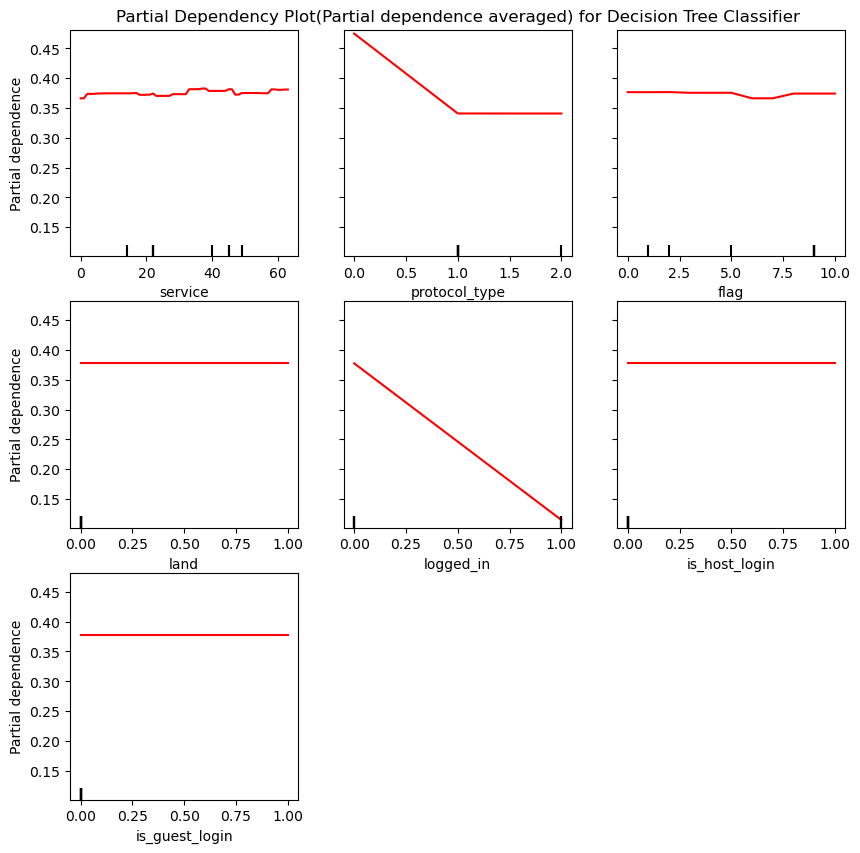

In [65]:
# Decision Tree Classifier
from sklearn.inspection import PartialDependenceDisplay
fig , ax = plt.subplots(figsize=(10, 10))
ax.set_title("Partial Dependency Plot(Partial dependence averaged) for Decision Tree Classifier")
PDP_dt = PartialDependenceDisplay.from_estimator(model_dt,X_test,features=['service','protocol_type','flag','land','logged_in','is_host_login','is_guest_login'],
                                               feature_names = X_features_dt,random_state=10,ax=ax,kind='average',
                                               method='auto',line_kw={"color": "red"})

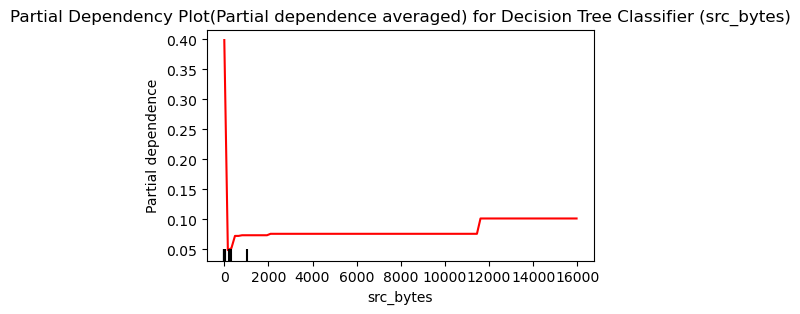

In [66]:
fig , ax = plt.subplots(figsize=(5, 3))
ax.set_title("Partial Dependency Plot(Partial dependence averaged) for Decision Tree Classifier (src_bytes)")
PDP1 = PartialDependenceDisplay.from_estimator(model_dt,X_test,features=['src_bytes'],
                                               feature_names = X_features_dt,random_state=10,ax=ax,kind='average',
                                               method='auto',line_kw={"color": "red"})

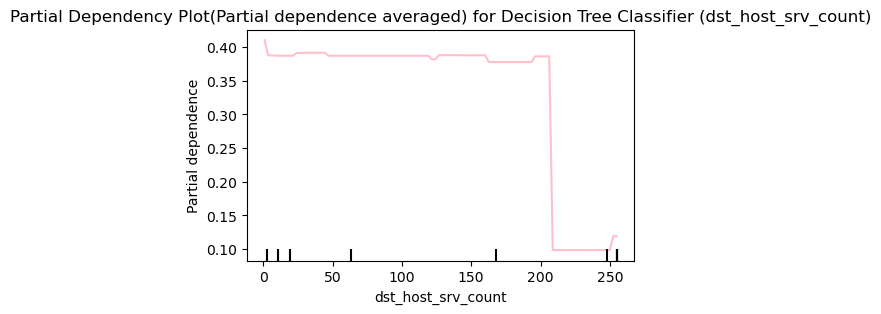

In [67]:
fig , ax = plt.subplots(figsize=(5, 3))
ax.set_title("Partial Dependency Plot(Partial dependence averaged) for Decision Tree Classifier (dst_host_srv_count)")
PDP2 = PartialDependenceDisplay.from_estimator(model_dt,X_test,features=['dst_host_srv_count'],
                                               feature_names = X_features_dt,random_state=10,ax=ax,kind='average',
                                               method='auto',line_kw={"color": "pink"})

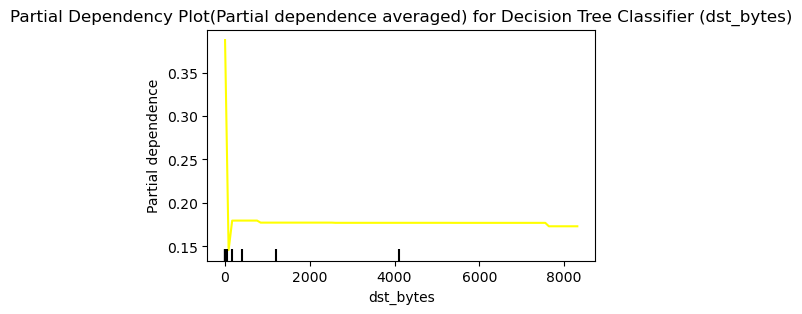

In [68]:
fig , ax = plt.subplots(figsize=(5, 3))
ax.set_title("Partial Dependency Plot(Partial dependence averaged) for Decision Tree Classifier (dst_bytes)")
PDP3 = PartialDependenceDisplay.from_estimator(model_dt,X_test,features=['dst_bytes'],
                                               feature_names = X_features_dt,random_state=10,ax=ax,kind='average',
                                               method='auto',line_kw={"color": "yellow"})

#### 2) PDP's for Random Forest Classifier

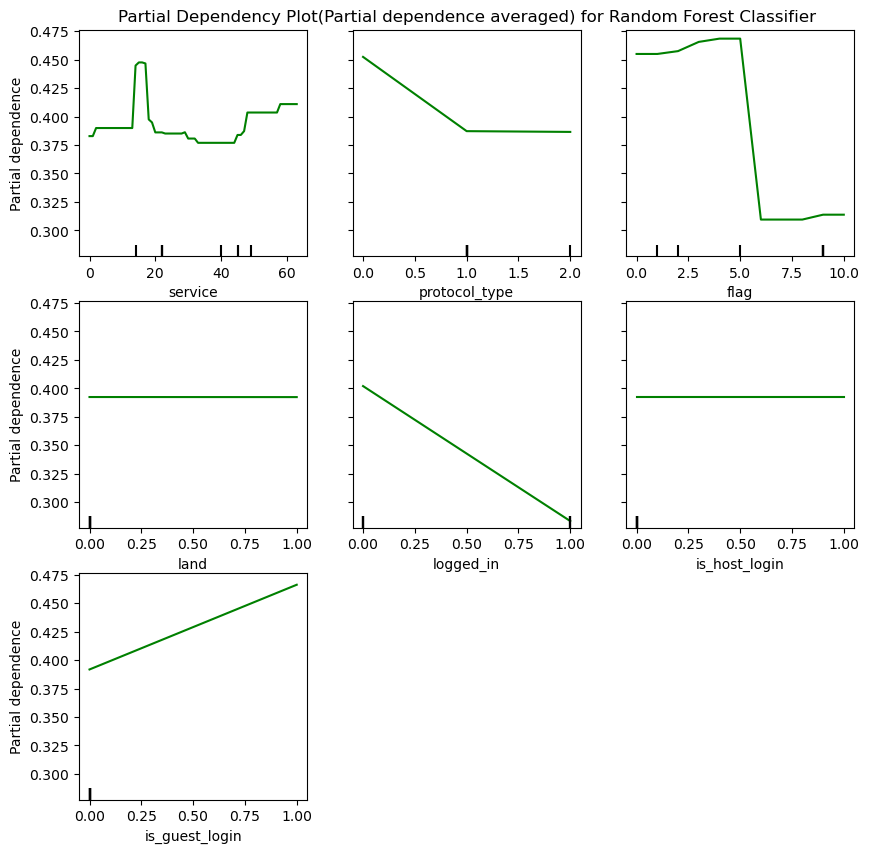

In [69]:
# Random Forest Classifier
fig , ax = plt.subplots(figsize=(10, 10))
ax.set_title("Partial Dependency Plot(Partial dependence averaged) for Random Forest Classifier")
PDP_rf = PartialDependenceDisplay.from_estimator(model_rf,X_test,features=['service','protocol_type','flag','land','logged_in','is_host_login','is_guest_login'],
                                               feature_names = X_features_rf,random_state=10,ax=ax,kind='average',
                                               method='auto',line_kw={"color": "green"})

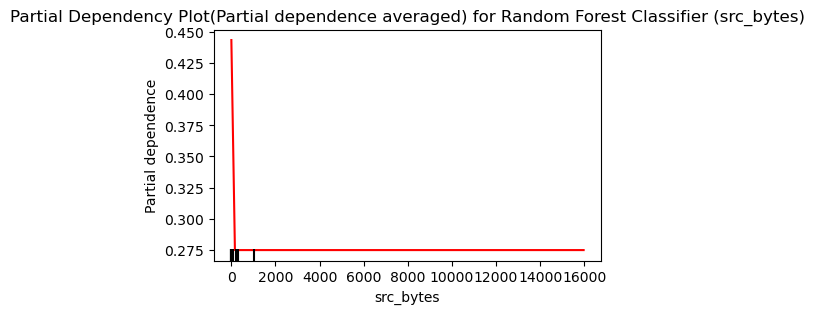

In [70]:
fig , ax = plt.subplots(figsize=(5, 3))
ax.set_title("Partial Dependency Plot(Partial dependence averaged) for Random Forest Classifier (src_bytes)")
PDP_1 = PartialDependenceDisplay.from_estimator(model_rf,X_test,features=['src_bytes'],
                                               feature_names = X_features_rf,random_state=10,ax=ax,kind='average',
                                               method='auto',line_kw={"color": "red"})

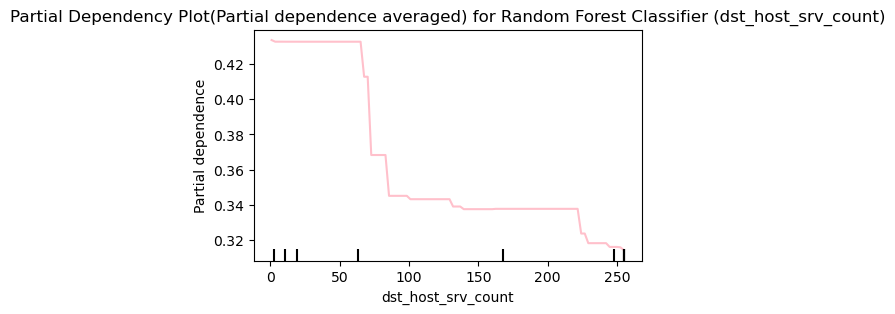

In [71]:
fig , ax = plt.subplots(figsize=(5, 3))
ax.set_title("Partial Dependency Plot(Partial dependence averaged) for Random Forest Classifier (dst_host_srv_count)")
PDP_2 = PartialDependenceDisplay.from_estimator(model_rf,X_test,features=['dst_host_srv_count'],
                                               feature_names = X_features_rf,random_state=10,ax=ax,kind='average',
                                               method='auto',line_kw={"color": "pink"})

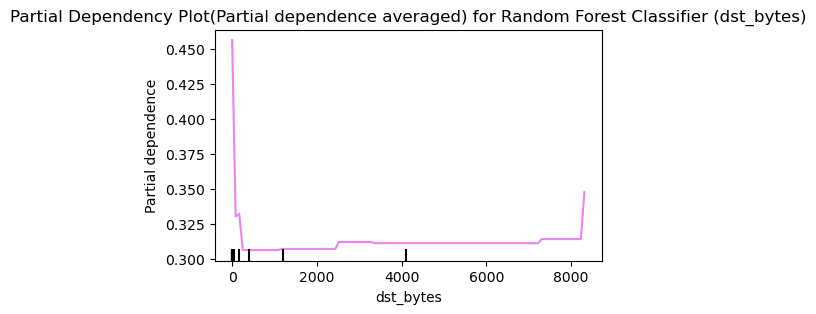

In [72]:
fig , ax = plt.subplots(figsize=(5, 3))
ax.set_title("Partial Dependency Plot(Partial dependence averaged) for Random Forest Classifier (dst_bytes)")
PDP_3 = PartialDependenceDisplay.from_estimator(model_rf,X_test,features=['dst_bytes'],
                                               feature_names = X_features_rf,random_state=10,ax=ax,kind='average',
                                               method='auto',line_kw={"color": "violet"})

Insights: PDP for categorical variables show that there is marginal effect of input feature on the target variable and keeps rest other features constant. So it will show the average value of target for each category.
For the non-categorical features which has highest values, PDP will show the average target value for different values.

Conclusion: It helps us to show the average values of all the variables and identifies if any non-linear relationships is present between input and the target variable.

### 2.2) Understanding the model using Individual Conditional Expectations (ICE)

- ICE is an extension of PDP. We can explain heterogeneous relationships. 
- While PDP supports two feature explanations using ICE we can explain only one feature at a time.
- PDP will show the average effect of a feature while ICE plot shows the effect for a single instance.
- ICE is required in global interpretation because they provide a more detailed understanding of how a model makes a prediction.
- It is used because 
1. Identifies direction, magnitude of the impact of a feature on predicted outcome
2. Identifies bias in the model


#### 1) ICE for Decision Tree Classifier

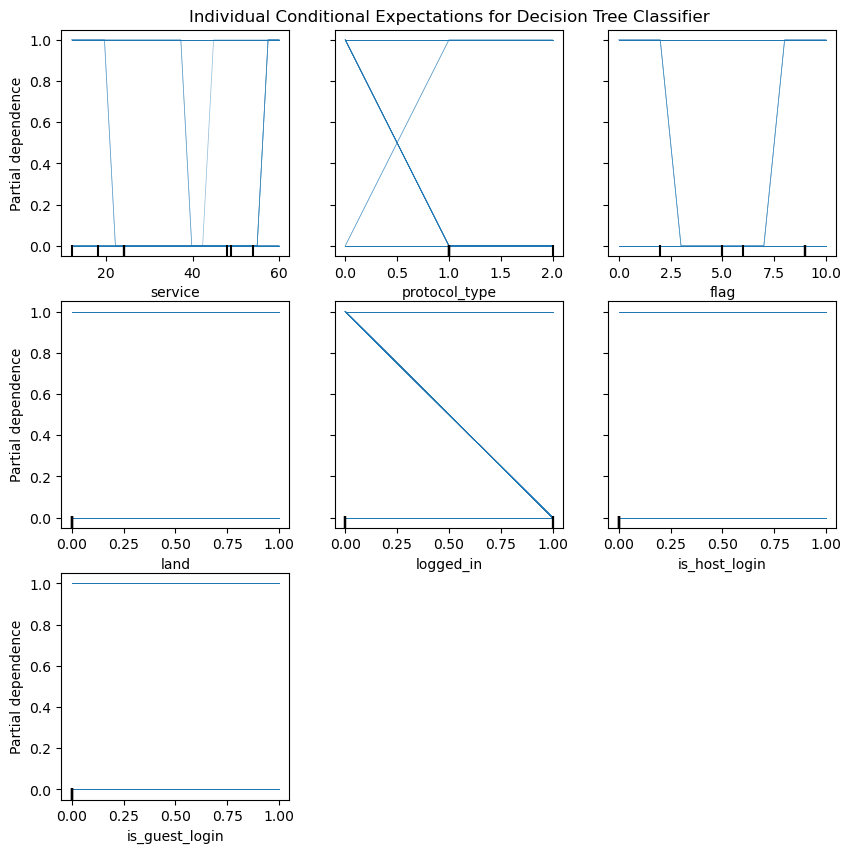

In [73]:
# Decision Tree Classifier
fig , ax = plt.subplots(figsize=(10, 10))
ax.set_title("Individual Conditional Expectations for Decision Tree Classifier")
ICE1 = PartialDependenceDisplay.from_estimator(model_dt,
                                               X_train,features = ['service','protocol_type','flag','land','logged_in','is_host_login','is_guest_login'],
                                               feature_names = X_features_dt,random_state=10,
                                               ax=ax,kind='individual', 
                                               method='auto',subsample=100, 
                                               n_jobs=3,grid_resolution=20, 
                                               ice_lines_kw={"color": "tab:blue", "alpha": 0.5, "linewidth": 0.5},)

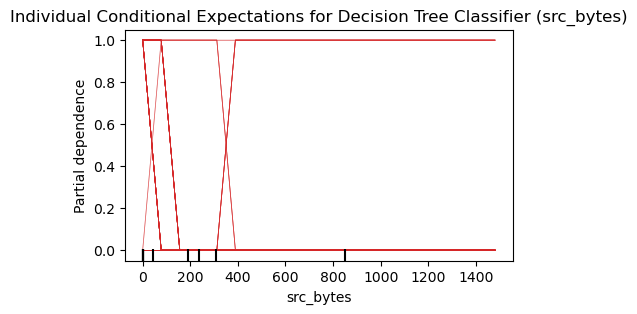

In [74]:
# Decision Tree Classifier
fig , ax = plt.subplots(figsize=(5, 3))
ax.set_title("Individual Conditional Expectations for Decision Tree Classifier (src_bytes)")
ICE_1 = PartialDependenceDisplay.from_estimator(model_dt,
                                               X_train,features = ['src_bytes'],
                                               feature_names = X_features_dt,random_state=10,
                                               ax=ax,kind='individual', 
                                               method='auto',subsample=100, 
                                               n_jobs=3,grid_resolution=20, 
                                               ice_lines_kw={"color": "tab:red", "alpha": 0.5, "linewidth": 0.5},)

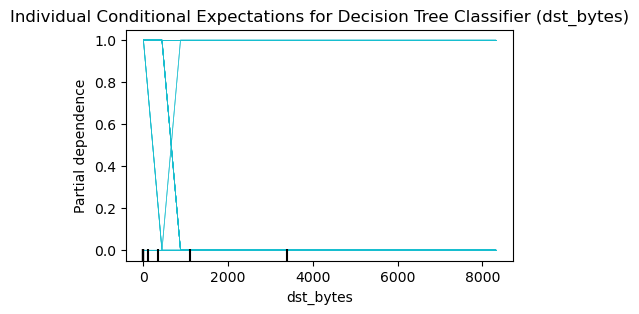

In [75]:
# Decision Tree Classifier
fig , ax = plt.subplots(figsize=(5, 3))
ax.set_title("Individual Conditional Expectations for Decision Tree Classifier (dst_bytes)")
ICE_2 = PartialDependenceDisplay.from_estimator(model_dt,
                                               X_train,features = ['dst_bytes'],
                                               feature_names = X_features_dt,random_state=10,
                                               ax=ax,kind='individual', 
                                               method='auto',subsample=100, 
                                               n_jobs=3,grid_resolution=20, 
                                               ice_lines_kw={"color": "tab:cyan", "alpha": 0.5, "linewidth": 0.5},)

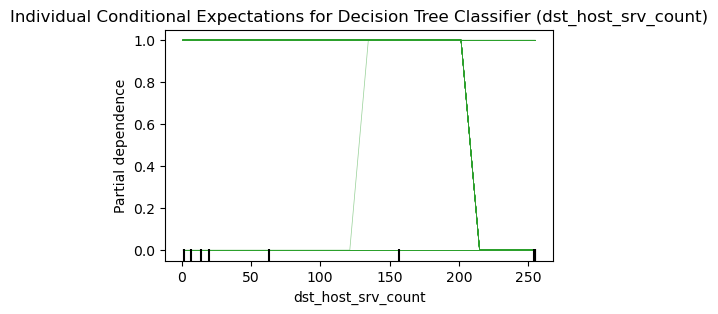

In [76]:
# Decision Tree Classifier
fig , ax = plt.subplots(figsize=(5, 3))
ax.set_title("Individual Conditional Expectations for Decision Tree Classifier (dst_host_srv_count)")
ICE_3 = PartialDependenceDisplay.from_estimator(model_dt,
                                               X_train,features = ['dst_host_srv_count'],
                                               feature_names = X_features_dt,random_state=10,
                                               ax=ax,kind='individual', 
                                               method='auto',subsample=100, 
                                               n_jobs=3,grid_resolution=20, 
                                               ice_lines_kw={"color": "tab:green", "alpha": 0.5, "linewidth": 0.5},)

#### 2) Individual Conditional Expectations and Partial Dependence for Decision Tree Classifier

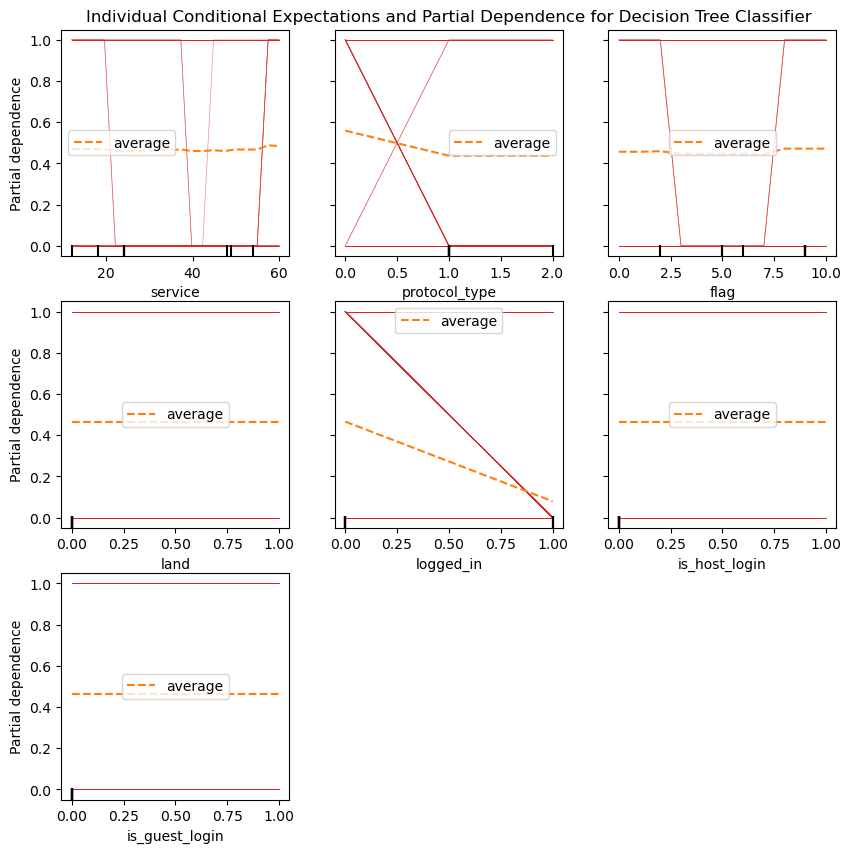

In [77]:
# Decision Tree Classifier
fig , ax = plt.subplots(figsize=(10, 10))
ax.set_title("Individual Conditional Expectations and Partial Dependence for Decision Tree Classifier")
ICE2 = PartialDependenceDisplay.from_estimator(model_dt,
                                               X_train,features = ['service','protocol_type','flag','land','logged_in','is_host_login','is_guest_login'],
                                               feature_names = X_features_dt,random_state=10,
                                               ax=ax,kind='both', method='auto',subsample=100,n_jobs=3,grid_resolution=20, 
                                               ice_lines_kw={"color": "tab:red", "alpha": 0.5, "linewidth": 0.5},)

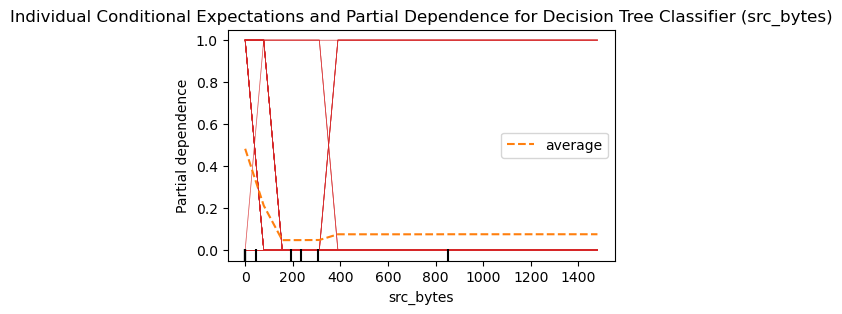

In [78]:
# Decision Tree Classifier
fig , ax = plt.subplots(figsize=(5, 3))
ax.set_title("Individual Conditional Expectations and Partial Dependence for Decision Tree Classifier (src_bytes)")
ICE_1 = PartialDependenceDisplay.from_estimator(model_dt,
                                               X_train,features = ['src_bytes'],
                                               feature_names = X_features_dt,random_state=10,
                                               ax=ax,kind='both', method='auto',subsample=100,n_jobs=3,grid_resolution=20, 
                                               ice_lines_kw={"color": "tab:red", "alpha": 0.5, "linewidth": 0.5},)

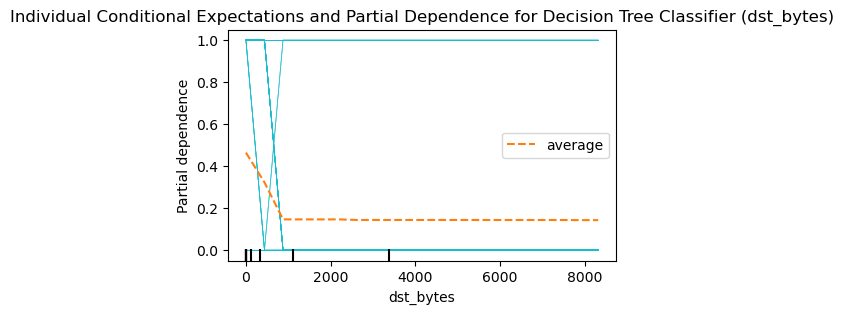

In [79]:
# Decision Tree Classifier
fig , ax = plt.subplots(figsize=(5, 3))
ax.set_title("Individual Conditional Expectations and Partial Dependence for Decision Tree Classifier (dst_bytes)")
ICE_2 = PartialDependenceDisplay.from_estimator(model_dt,
                                               X_train,features = ['dst_bytes'],
                                               feature_names = X_features_dt,random_state=10,
                                               ax=ax,kind='both', method='auto',subsample=100,n_jobs=3,grid_resolution=20, 
                                               ice_lines_kw={"color": "tab:cyan", "alpha": 0.5, "linewidth": 0.5},)

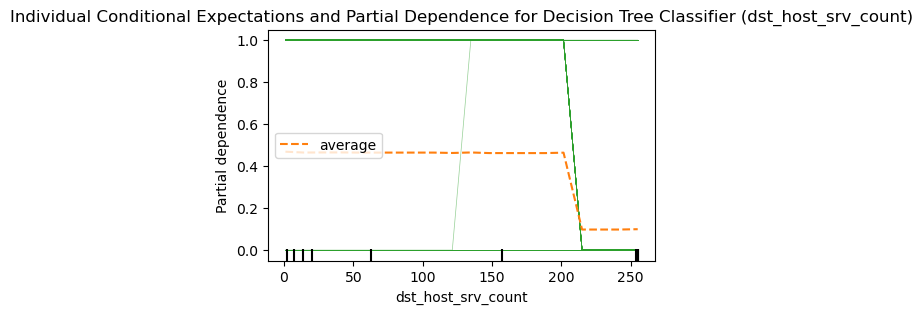

In [80]:
# Decision Tree Classifier
fig , ax = plt.subplots(figsize=(5, 3))
ax.set_title("Individual Conditional Expectations and Partial Dependence for Decision Tree Classifier (dst_host_srv_count)")
ICE_3 = PartialDependenceDisplay.from_estimator(model_dt,
                                               X_train,features = ['dst_host_srv_count'],
                                               feature_names = X_features_dt,random_state=10,
                                               ax=ax,kind='both', method='auto',subsample=100,n_jobs=3,grid_resolution=20, 
                                               ice_lines_kw={"color": "tab:green", "alpha": 0.5, "linewidth": 0.5},)

#### 3) ICE for Random Forest Classifier

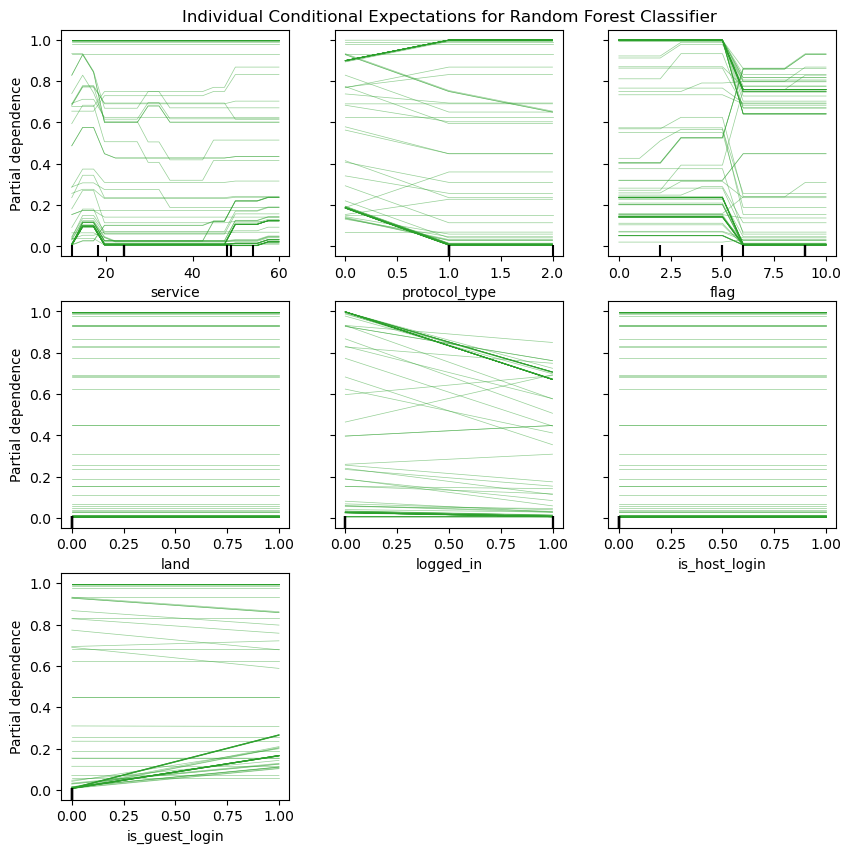

In [81]:
# Random Forest Classifier
fig , ax = plt.subplots(figsize=(10, 10))
ax.set_title("Individual Conditional Expectations for Random Forest Classifier")
ICE_rf = PartialDependenceDisplay.from_estimator(model_rf,
                                               X_train,features = ['service','protocol_type','flag','land','logged_in','is_host_login','is_guest_login'],
                                               feature_names = X_features_rf,random_state=10,
                                               ax=ax,kind='individual', 
                                               method='auto',subsample=100, 
                                               n_jobs=3,grid_resolution=20, 
                                               ice_lines_kw={"color": "tab:green", "alpha": 0.5, "linewidth": 0.5},)

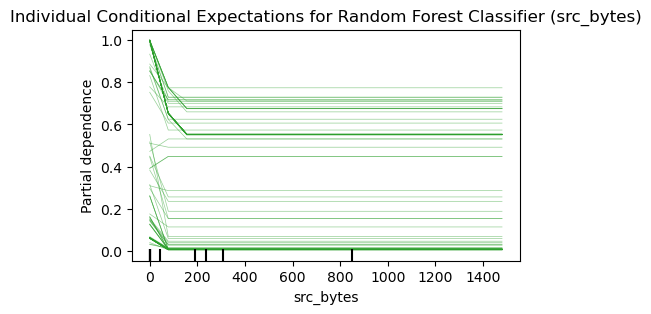

In [82]:
fig , ax = plt.subplots(figsize=(5, 3))
ax.set_title("Individual Conditional Expectations for Random Forest Classifier (src_bytes)")
ICE_1 = PartialDependenceDisplay.from_estimator(model_rf,
                                               X_train,features = ['src_bytes'],
                                               feature_names = X_features_rf,random_state=10,
                                               ax=ax,kind='individual', 
                                               method='auto',subsample=100, 
                                               n_jobs=3,grid_resolution=20, 
                                               ice_lines_kw={"color": "tab:green", "alpha": 0.5, "linewidth": 0.5},)

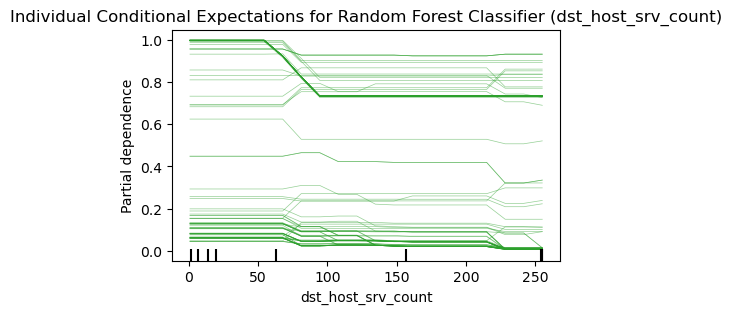

In [83]:
fig , ax = plt.subplots(figsize=(5, 3))
ax.set_title("Individual Conditional Expectations for Random Forest Classifier (dst_host_srv_count)")
ICE_2 = PartialDependenceDisplay.from_estimator(model_rf,
                                               X_train,features = ['dst_host_srv_count'],
                                               feature_names = X_features_rf,random_state=10,
                                               ax=ax,kind='individual', 
                                               method='auto',subsample=100, 
                                               n_jobs=3,grid_resolution=20, 
                                               ice_lines_kw={"color": "tab:green", "alpha": 0.5, "linewidth": 0.5},)

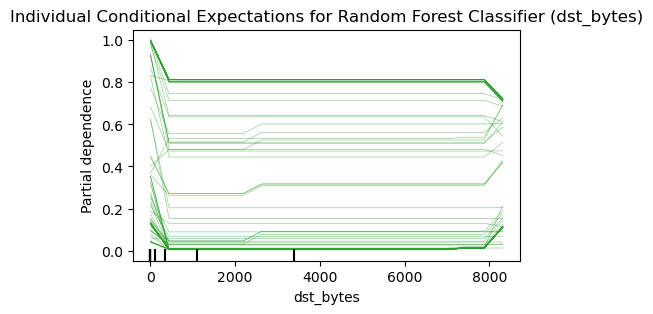

In [84]:
fig , ax = plt.subplots(figsize=(5, 3))
ax.set_title("Individual Conditional Expectations for Random Forest Classifier (dst_bytes)")
ICE_3 = PartialDependenceDisplay.from_estimator(model_rf,
                                               X_train,features = ['dst_bytes'],
                                               feature_names = X_features_rf,random_state=10,
                                               ax=ax,kind='individual', 
                                               method='auto',subsample=100, 
                                               n_jobs=3,grid_resolution=20, 
                                               ice_lines_kw={"color": "tab:green", "alpha": 0.5, "linewidth": 0.5},)

#### 4) Individual Conditional Expectations and Partial Dependence for Random Forest Classifier

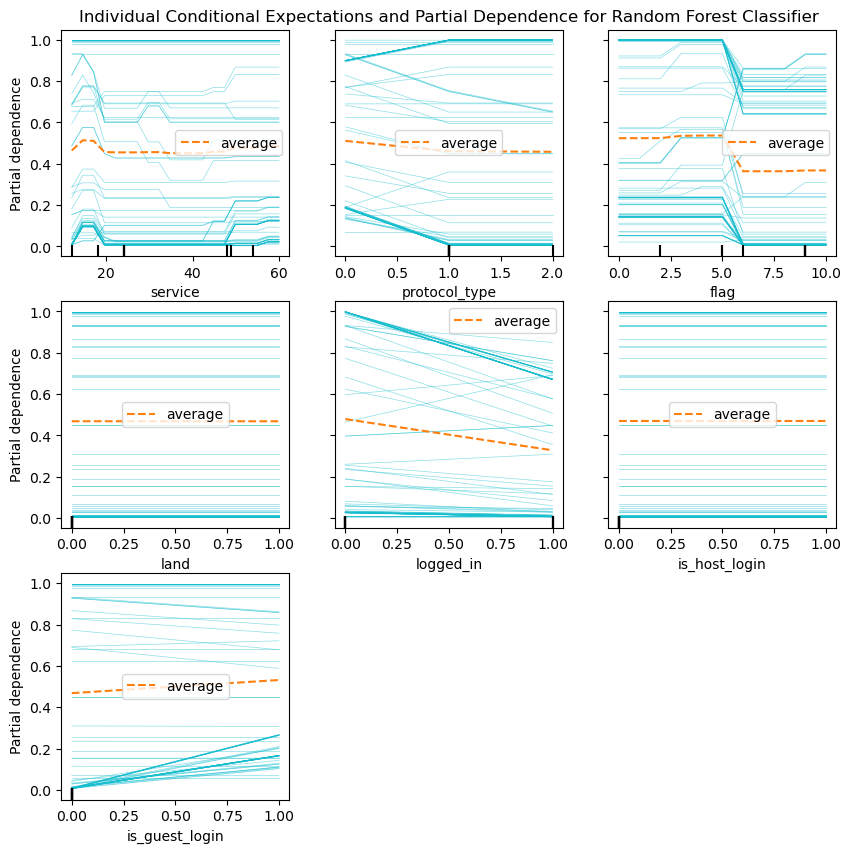

In [85]:
# Random Forest Classifier
fig , ax = plt.subplots(figsize=(10, 10))
ax.set_title("Individual Conditional Expectations and Partial Dependence for Random Forest Classifier")
ICE_all = PartialDependenceDisplay.from_estimator(model_rf,
                                               X_train,features = ['service','protocol_type','flag','land','logged_in','is_host_login','is_guest_login'],
                                               feature_names = X_features_rf,random_state=10,
                                               ax=ax,kind='both', method='auto',subsample=100, 
                                               n_jobs=3,grid_resolution=20, 
                                               ice_lines_kw={"color": "tab:cyan", "alpha": 0.5, "linewidth": 0.5},)

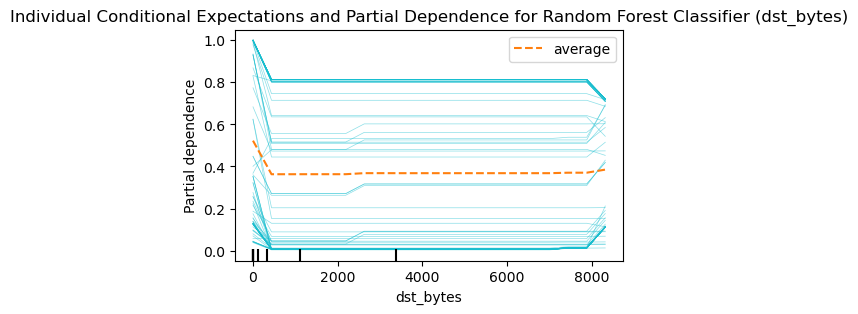

In [86]:
# Random Forest Classifier
fig , ax = plt.subplots(figsize=(5, 3))
ax.set_title("Individual Conditional Expectations and Partial Dependence for Random Forest Classifier (dst_bytes)")
ICE_1 = PartialDependenceDisplay.from_estimator(model_rf,
                                               X_train,features = ['dst_bytes'],
                                               feature_names = X_features_rf,random_state=10,
                                               ax=ax,kind='both', method='auto',subsample=100, 
                                               n_jobs=3,grid_resolution=20, 
                                               ice_lines_kw={"color": "tab:cyan", "alpha": 0.5, "linewidth": 0.5},)

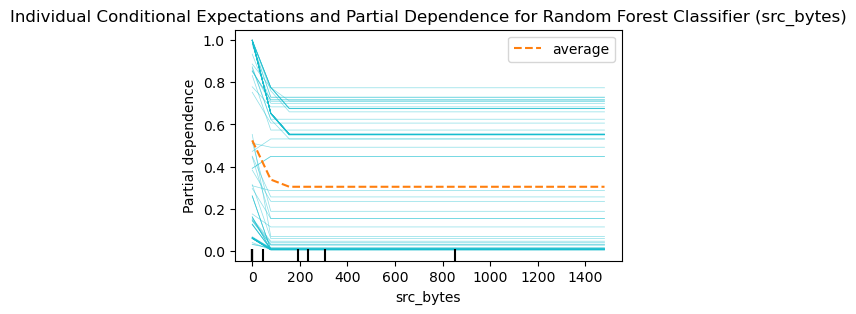

In [87]:
# Random Forest Classifier
fig , ax = plt.subplots(figsize=(5, 3))
ax.set_title("Individual Conditional Expectations and Partial Dependence for Random Forest Classifier (src_bytes)")
ICE_2 = PartialDependenceDisplay.from_estimator(model_rf,
                                               X_train,features = ['src_bytes'],
                                               feature_names = X_features_rf,random_state=10,
                                               ax=ax,kind='both', method='auto',subsample=100, 
                                               n_jobs=3,grid_resolution=20, 
                                               ice_lines_kw={"color": "tab:cyan", "alpha": 0.5, "linewidth": 0.5},)

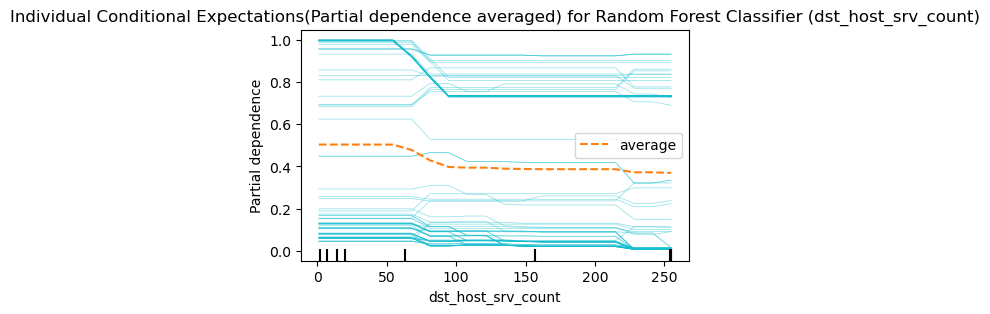

In [88]:
# Random Forest Classifier
fig , ax = plt.subplots(figsize=(5, 3))
ax.set_title("Individual Conditional Expectations(Partial dependence averaged) for Random Forest Classifier (dst_host_srv_count)")
ICE_3 = PartialDependenceDisplay.from_estimator(model_rf,
                                               X_train,features = ['dst_host_srv_count'],
                                               feature_names = X_features_rf,random_state=10,
                                               ax=ax,kind='both', method='auto',subsample=100, 
                                               n_jobs=3,grid_resolution=20, 
                                               ice_lines_kw={"color": "tab:cyan", "alpha": 0.5, "linewidth": 0.5},)

Insights: Number of features with partial dependence values are more in Random Forest Classifier than Decision Tree Classifier since more features have impact in Random Forest Classifier.

Conclusion: ICE plots will display each feature which contribute to the impact of model's prediction at each data points as compared to PDP wherein it considers all data points together.

## 3) Different Local Interpretation Methods
- These methods are typically used with machine learning models whose predictions are difficult to explain.
- LIME and SHAP determine feature importance in complex models where direct interpretation of model predictions is not feasible.
- Understanding these methods can help data scientists approach model explainability for a variable of machine learning models whether they are simple or complex. 

### 3.1) Understanding the model using Local Interpretation of Model Explanation (LIME)

LIME treats the model as a black box. It doesn’t distinguish between random forest, a decision tree or neural networks. It uses linear models to provide a local explanation.
LIME provides a local interpretation by modifying feature values of a single data sample and observing its impact on the output. It builds a model from the input and model predictions. An interpretable model can be used as a surrogate model. Because LIME is a model agnostic technique, therefore it can be used on any model.
It aims to identify an interpretable model over the interpretable representation that is locally faithful to the Classifier.
Properties of LIME:
1) Interpretable: It should provide a qualitative understanding between the input variables and the response.
2) Local Fidelity: It might not be possible for an explanation to be completely faithful unless it is the complete description of the model itself. It should be at least locally faithful i.e it must replicate the model’s behavior in the vicinity of the instance being predicted. 
3) Model Agnostic: The explainer should be able to explain any model and should not make any assumptions about the model while providing explanations. 
4) Global perspective: The explainer should explain a representative set to the user so that the user has a global intuition of the model.

Steps involved in LIME:

1.It creates a permutation (fake) of the given data.

2.It calculates the distance between permutations and the original observations. Also, we can specify the distance measured.

3.It makes predictions on the new data.

4.It picks “m” features that describe the complex model. It is an outcome from the permuted data in the best possible way through the maximum likelihood approach. Here, we can decide the number of features i.e. the value of “m” we want to use.

5.It picks the “m” features and fits a simple model to the permuted data with the similarity score as weights.

6.The weights from the simple model are used to provide explanations for the complex model’s local behavior.


Pros: 
1. It will work well on images, text and tabular data.

2. It is model agnostic.

Cons: 
1. It suffers from labels and data shift, explanations dependent on the choice of hyperparameters.

2. Sometimes similar datapoints may have different explanations.

LIME is typically faster to compute than SHAP.

In [89]:
import lime
import lime.lime_tabular

#### A) Lime explainer for Decision Tree Classifier model

In [90]:
explainer_dt = (lime.lime_tabular.LimeTabularExplainer(training_data = X_train.to_numpy(), 
                                   training_labels = y_train,                                   
                                   feature_names = X_features_dt, 
                                   class_names = ['class_tranform'],
                                   kernel_width=3,
                                   verbose = True ))
print(explainer_dt)

In [91]:
X_test.iloc[1]

duration                         0.00
protocol_type                    1.00
service                         45.00
flag                             1.00
src_bytes                        0.00
dst_bytes                        0.00
land                             0.00
wrong_fragment                   0.00
urgent                           0.00
hot                              0.00
num_failed_logins                0.00
logged_in                        0.00
num_compromised                  0.00
root_shell                       0.00
su_attempted                     0.00
num_file_creations               0.00
num_shells                       0.00
num_access_files                 0.00
num_outbound_cmds                0.00
is_host_login                    0.00
is_guest_login                   0.00
count                          136.00
srv_count                        1.00
serror_rate                      0.00
rerror_rate                      1.00
same_srv_rate                    0.01
diff_srv_rat

#### Lime explainer for class 0 and class 1

- An intercept means how likely is the positive class when all the features happen to have zero value. 
- A large intercept value means a large chance of the positive class
Formula for prediction_local: exp.local_exp = exp.intercept[1]  + sum([weight[1] for weight in exp.local_exp[1]])
- Right: Actual prediction of the model

In [92]:
lime_explainer_dt = explainer_dt.explain_instance(X_test.iloc[0].to_numpy(),model_dt.predict_proba)

Intercept 0.3300535726184094
Prediction_local [0.35392773]
Right: 1.0


In [93]:
lime_explainer_dt_1 = explainer_dt.explain_instance(X_test.iloc[11].to_numpy(),model_dt.predict_proba)

Intercept 0.2545590006909678
Prediction_local [0.02025979]
Right: 0.0


In [94]:
lime_explainer_dt.show_in_notebook(show_table=True, predict_proba=True,
    show_predicted_value=True, show_all=True)

In [95]:
lime_explainer_dt = explainer_dt.explain_instance(X_test.iloc[100].to_numpy(),model_dt.predict_proba)

Intercept -0.30462209787372996
Prediction_local [0.37432397]
Right: 1.0


In [96]:
lime_explainer_dt.show_in_notebook(show_table=True,predict_proba=True,
    show_predicted_value=True, show_all=True)

In [97]:
lime_explainer_dt.show_in_notebook(show_table=True)

#### B) Lime explainer for Random Forest Classifier model

In [98]:
# Random Forest Classifier
explainer_rf = (lime.lime_tabular.LimeTabularExplainer(training_data = X_train.to_numpy(), 
                                   training_labels = y_train,                                   
                                   feature_names = X_features_rf, 
                                   class_names = ['class_tranform'],
                                   kernel_width=3,
                                   verbose = True ))
print(explainer_rf)

#### Lime explainer for class 0 and 1

In [99]:
lime_explainer_rf = explainer_rf.explain_instance(X_test.iloc[1].to_numpy(),model_rf.predict_proba)

Intercept 0.14722722623649198
Prediction_local [0.70938772]
Right: 0.9973805547145954


In [100]:
lime_explainer_rf_1 = explainer_rf.explain_instance(X_test.iloc[17].to_numpy(),model_rf.predict_proba)

Intercept 0.5928919841156635
Prediction_local [0.02981476]
Right: 0.008791617829069637


In [101]:
lime_explainer_rf.show_in_notebook(show_table=True, predict_proba=True,
    show_predicted_value=True, show_all=True)

In [102]:
lime_explainer_rf = explainer_rf.explain_instance(X_test.iloc[100].to_numpy(),model_rf.predict_proba)

Intercept 0.23898313166145121
Prediction_local [0.67135382]
Right: 0.9973805547145954


In [103]:
lime_explainer_rf.show_in_notebook(show_table=True,predict_proba=True,
    show_predicted_value=True, show_all=True)

In [104]:
lime_explainer_rf.show_in_notebook(show_table=True)

Insights: It helps us to calculate local prediction values, right predictions and distinguishes the feature and its values based on the target variable i.e. class (0 : Normal Connection and 1: Bad Connection) after looking at the color code.

Conclusion: In the decision tree classifier, more features belonged to class 1 and less features belonged to class 0. In random forest classifier, only one feature wrong_fragment belonged to class 0 and the rest other features belonged to class 1.

### 3.2) Understanding the model using SHAP (SHapley Additive exPlanations)

- SHAP is framework which explains the output of any model using Shapley values. It follows Game theory approach.

Pros:
- It can compute efficiently on the specific model classes.
- It can be used globally and locally.

Though, SHAP will be more accurate with feature explanation than LIME since it is mathematically rigorous. For this reason, SHAP is more computationally intensive and is a good option.

Cons:
- The Shapley value requires a lot of computing time.
- The Shapley value can be misinterpreted. 
- It returns a simple value per feature, but no prediction model like LIME.

In [105]:
import shap
shap.initjs()
shap_explanation = shap.TreeExplainer(model_dt)
print(shap_explanation)

- The predict_proba function will return the probabilities of a classification label. 
- This function analyses a row of independent data in a dataset and returns the probability of a result.

#### A) Shap explanation for Decision Tree Classifier

In [106]:
data_predict = X_test.iloc[4]
print(data_predict.values.reshape(1,-1))
array_data_predict = data_predict.values.reshape(1,-1)
model_dt.predict_proba(array_data_predict)

[[1.0e+00 1.0e+00 5.5e+01 2.0e+00 0.0e+00 1.5e+01 0.0e+00 0.0e+00 0.0e+00
  0.0e+00 0.0e+00 0.0e+00 0.0e+00 0.0e+00 0.0e+00 0.0e+00 0.0e+00 0.0e+00
  0.0e+00 0.0e+00 0.0e+00 1.0e+00 8.0e+00 0.0e+00 1.0e+00 1.0e+00 0.0e+00
  7.5e-01 2.9e+01 8.6e+01 3.1e-01 1.7e-01 3.0e-02 2.0e-02 8.3e-01]]


array([[0., 1.]])

In [107]:
np.bool = np.bool_

In [108]:
shap_values = shap_explanation.shap_values(X_test)
print(shap_values)

[array([[ 5.87534285e-02,  9.21898495e-03, -1.14393349e-02, ...,
         3.06494844e-03, -8.66632503e-05, -9.87655069e-02],
       [ 5.99302405e-02,  1.04903409e-02, -1.31964430e-02, ...,
         2.85007815e-03, -4.48854370e-07, -9.44598720e-02],
       [-1.39817837e-03,  8.02380008e-02,  2.83789335e-03, ...,
         4.88767449e-04,  3.64165474e-03,  4.70835332e-03],
       ...,
       [-2.47744768e-03,  3.30311167e-02,  2.73001668e-04, ...,
         1.52465687e-02, -1.97394129e-03,  1.04180245e-04],
       [-4.88328188e-04,  3.07564510e-02,  9.78877248e-03, ...,
         2.83814072e-03,  1.73991389e-03,  2.85462762e-03],
       [-9.04528526e-04,  1.08476605e-02, -1.68516681e-02, ...,
         6.16735262e-03,  9.83915528e-04, -7.19282176e-03]]), array([[-5.87534285e-02, -9.21898495e-03,  1.14393349e-02, ...,
        -3.06494844e-03,  8.66632503e-05,  9.87655069e-02],
       [-5.99302405e-02, -1.04903409e-02,  1.31964430e-02, ...,
        -2.85007815e-03,  4.48854367e-07,  9.44598720

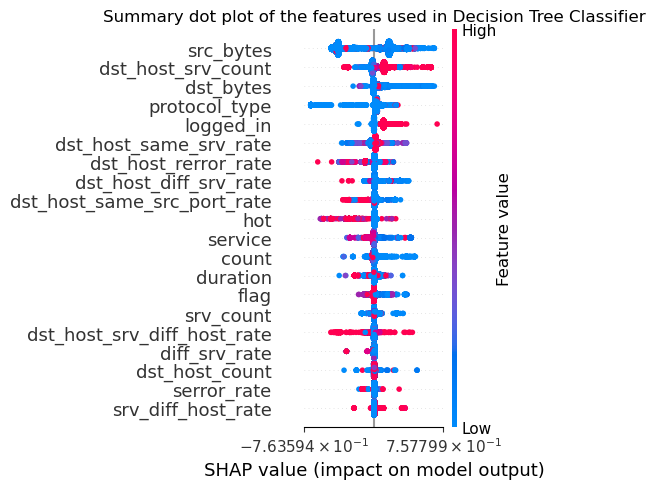

In [109]:
plt.title('Summary dot plot of the features used in Decision Tree Classifier')
shap.summary_plot(shap_values[0],X_test, feature_names=X_features_dt,plot_size=(5,5),
                  plot_type='dot',use_log_scale=True, show=True, sort=True)

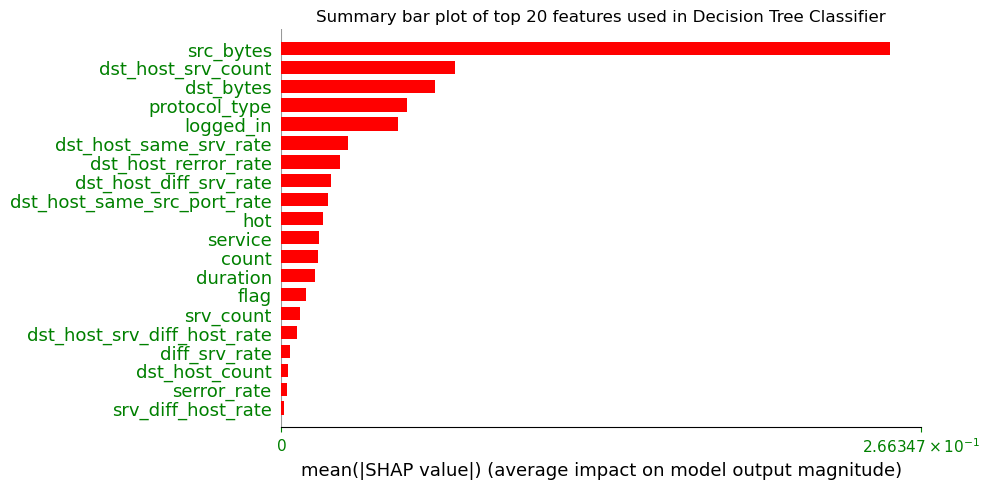

In [110]:
plt.title('Summary bar plot of top 20 features used in Decision Tree Classifier')
shap.summary_plot(shap_values[0],X_test, feature_names=X_features_dt,plot_type='bar',
                  plot_size=(10,5),max_display=20,
                 axis_color='green',color='red',auto_size_plot=2.0,layered_violin_max_num_bins=20,
                  alpha=1,show=True,sort=True,color_bar=True,use_log_scale=True)

- src_bytes has the highest mean SHAP value in the Decision Tree Classifier followed by dst_host_srv_count, dst_bytes.

#### B) Shap explanation for Random Forest Classifier

In [111]:
data_predict = X_test.iloc[4]
print(data_predict.values.reshape(1,-1))
array_data_predict = data_predict.values.reshape(1,-1)
model_rf.predict_proba(array_data_predict)

[[1.0e+00 1.0e+00 5.5e+01 2.0e+00 0.0e+00 1.5e+01 0.0e+00 0.0e+00 0.0e+00
  0.0e+00 0.0e+00 0.0e+00 0.0e+00 0.0e+00 0.0e+00 0.0e+00 0.0e+00 0.0e+00
  0.0e+00 0.0e+00 0.0e+00 1.0e+00 8.0e+00 0.0e+00 1.0e+00 1.0e+00 0.0e+00
  7.5e-01 2.9e+01 8.6e+01 3.1e-01 1.7e-01 3.0e-02 2.0e-02 8.3e-01]]


array([[0.64680464, 0.35319536]])

In [112]:
np.bool = np.bool_

In [113]:
shap_explanation_rf = shap.TreeExplainer(model_rf)
print(shap_explanation_rf)

In [114]:
shap_values_rf = shap_explanation_rf.shap_values(X_test)
print(shap_values_rf)

[array([[-0.00030085,  0.00281291,  0.0050602 , ...,  0.00467586,
        -0.00653305, -0.01540008],
       [-0.00028739,  0.00286764,  0.00421438, ...,  0.00472871,
        -0.00653305, -0.01541101],
       [-0.00028773,  0.00890642, -0.0169038 , ..., -0.02969957,
         0.02405985,  0.0024627 ],
       ...,
       [-0.00063339,  0.00685851,  0.007659  , ...,  0.00901606,
        -0.00761356, -0.05030105],
       [-0.00050804,  0.01114447,  0.00606178, ...,  0.01478242,
        -0.00736976,  0.00272544],
       [-0.00029892,  0.00212163,  0.01164229, ..., -0.01188333,
        -0.00587324, -0.0126043 ]]), array([[ 0.00030085, -0.00281291, -0.0050602 , ..., -0.00467586,
         0.00653305,  0.01540008],
       [ 0.00028739, -0.00286764, -0.00421438, ..., -0.00472871,
         0.00653305,  0.01541101],
       [ 0.00028773, -0.00890642,  0.0169038 , ...,  0.02969957,
        -0.02405985, -0.0024627 ],
       ...,
       [ 0.00063339, -0.00685851, -0.007659  , ..., -0.00901606,
        

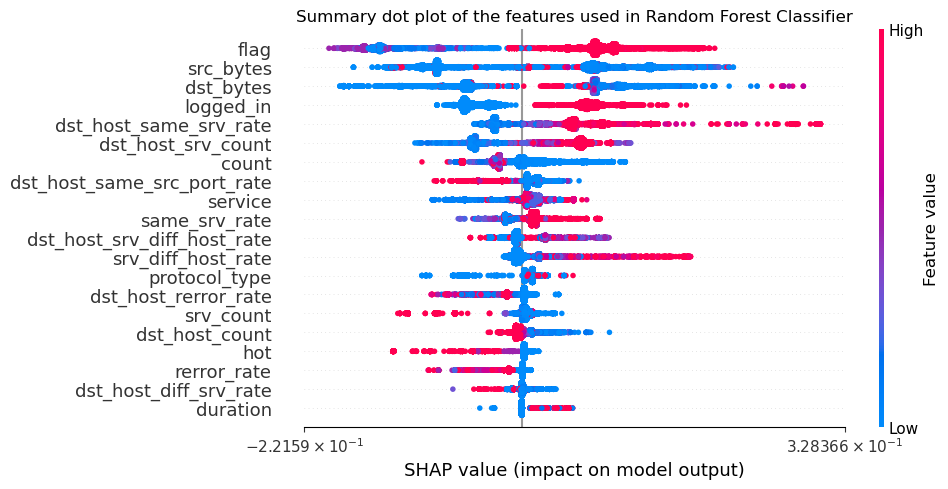

In [115]:
plt.title('Summary dot plot of the features used in Random Forest Classifier')
shap.summary_plot(shap_values_rf[0],X_test, feature_names=X_features_rf,plot_size=(10,5),
                  plot_type='dot',use_log_scale=True, show=True, sort=True)

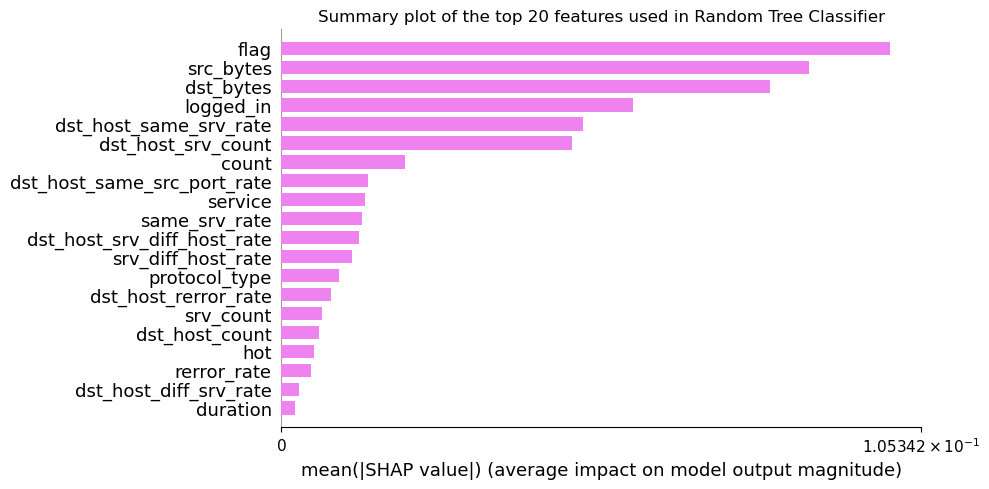

In [116]:
plt.title('Summary plot of the top 20 features used in Random Tree Classifier')
shap.summary_plot(shap_values_rf[0],X_test, feature_names=X_features_rf,plot_type='bar',
                  plot_size=(10,5),max_display=20,
                 axis_color='black',color='violet',auto_size_plot=2.0,layered_violin_max_num_bins=20,
                  alpha=1,show=True,sort=True,color_bar=True,use_log_scale=True)

- Flag has the highest mean SHAP value in Random Forest Classifier followed by src_bytes, dst_bytes, logged_in, dst_host_same_srv_rate, dst_host_srv_count.

Insights: SHAP directly help to understand which feature will have maximum and minimum contribution to model's prediction.
Conclusion: In Random forest classifier 6 features contribute more importantly to the model's prediction based on the mean SHAP value as compared to Decision Tree Classifier which has only 1 feature showing the highest mean SHAP value.

## References

1. https://www.analyticsvidhya.com/blog/2021/11/model-explainability/#:~:text=Model%20explainability%20refers%20to%20the,a%20particular%20disease%20or%20not.
2. https://www.analyticsvidhya.com/blog/2020/11/demystifying-model-interpretation-using-eli5/
3. https://www.analyticsvidhya.com/blog/2022/01/build-a-trustworthy-model-with-explainable-ai/
4. https://coderzcolumn.com/tutorials/machine-learning/shap-explain-machine-learning-model-predictions-using-game-theoretic-approach
5. https://towardsdatascience.com/a-look-into-global-cohort-and-local-model-explainability-973bd449969f
6. https://shap.readthedocs.io/en/latest/generated/shap.plots.force.html
7. https://www.twosigma.com/articles/interpretability-methods-in-machine-learning-a-brief-survey/
8. https://medium.com/mlearning-ai/explainable-ai-a-complete-summary-of-the-main-methods-a28f9ab132f7
9. https://www.analyticsvidhya.com/blog/2022/07/everything-you-need-to-know-about-lime/
10. https://christophm.github.io/interpretable-ml-book/pdp.html
11. https://coderzcolumn.com/tutorials/machine-learning/how-to-use-eli5-to-understand-sklearn-models-their-performance-and-their-predictions
12. https://github.com/mayur29/Machine-Learning-Model-Interpretation/blob/master/ELI5%20Model%20Interpretation.ipynb
13. https://towardsdatascience.com/decrypting-your-machine-learning-model-using-lime-5adc035109b5